# ThymoSight (mouse)

<a id='contents'></a>

## Table of contents 

### 0 Notebook setup <a href='#setup'>🕹️</a>

### 1 Data reanalysis <a href='#reanalysis'>🕹️</a>

- **2018.06.05 - Kernfeld et al. <a href='#kernfeld-2018'>🕹️</a> [🔗](https://www.cell.com/immunity/fulltext/S1074-7613(18)30184-5) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE107910)**

- **2018.07.18 - Bornstein et al. <a href='#bornstein-2018'>🕹️</a> [🔗](https://www.nature.com/articles/s41586-018-0346-1) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE103967)**

- **2019.10.28 - Dhalla et al. <a href='#dhalla-2019'>🕹️</a> [🔗](https://www.embopress.org/doi/full/10.15252/embj.2019101828) [⬇️](https://www.ebi.ac.uk/biostudies/arrayexpress/studies/E-MTAB-8105#)** 

- **2020.08.25 - Baran-Gale et al. <a href='#baranGale-2020'>🕹️</a> [🔗](https://elifesciences.org/articles/56221) [⬇️](https://bioconductor.org/packages/release/data/experiment/html/MouseThymusAgeing.html)**

- **2020.11.23 - Wells et al. <a href='#wells-2020'>🕹️</a> [🔗](https://elifesciences.org/articles/60188) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE137699)**

- **2021.12.03 - Rota et al. <a href='#rota-2021'>🕹️</a> [🔗](https://www.science.org/doi/10.1126/sciadv.abj9247) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE162668)**

- **2022.05.25 - Nusser et al. <a href='#nusser-2022'>🕹️</a> [🔗](https://www.nature.com/articles/s41586-022-04752-8) [⬇️](https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE106856&format=file)**

- **2022.07.07 - Michelson et al. <a href='#michelson-2022'>🕹️</a> [🔗](https://pubmed.ncbi.nlm.nih.gov/35714609/) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE194253)**

- **2023.07.10 - Klein et al. <a href='#klein-2023'>🕹️</a> [🔗](https://www.nature.com/articles/s41467-023-39722-9) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE215418)**

- **2023.07.25 - Farley et al. <a href='#farley-2023'>🕹️</a> [🔗](https://www.frontiersin.org/journals/immunology/articles/10.3389/fimmu.2023.1202163/full) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE232765)**

- **2023.09.06 - Givony et al. <a href='#givoni-2023'>🕹️</a> [🔗](https://www.nature.com/articles/s41586-023-06512-8) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE236075)**

- **2023.10.02 - Michelson et al. <a href='#michelson-2023'>🕹️</a> [🔗](https://rupress.org/jem/article/220/10/e20230461/214214/Hnf4-activates-mimetic-cell-enhancers-to) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE225661)**

- **2023.11.02 - Horie et al. <a href='#horie-2023'>🕹️</a> [🔗](https://www.frontiersin.org/journals/immunology/articles/10.3389/fimmu.2023.1186154/full) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE228198)**

- **????.??.?? - KousaJahnZhao et al. <a href='#kousajahnzhao-2024'>🕹️</a>**




### 2 Data integration <a href='#integration'>🕹️</a>

*Note: Click on 🕹️ to move to the respective notebook section. Click on ⬇️ to download the public dataset. Click on 🔗 for publication link.*

<a id='setup'></a>

## 0 Notebook setup

In [1]:
#import sys
#!{sys.executable} -m pip install ipywidgets
#!{sys.executable} -m pip install scrublet
#!{sys.executable} -m pip install openpyxl
#!{sys.executable} -m pip install harmonypy==0.0.6

In [2]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import matplotlib.font_manager
import matplotlib.lines as lines
import seaborn as sns
#import feather
import re
import os
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
import matplotlib.lines as lines

from collections import Counter
from pathlib import Path
from scipy import sparse

#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=13
sc.logging.print_header()

pd.set_option('display.max_rows', 100)

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


In [3]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [4]:
# adapted from https://autobencoder.com/2021-10-03-gene-conversion/
    
import biomart

def get_ensembl_mappings():                                   
    # Set up connection to server                                               
    server = biomart.BiomartServer('http://useast.ensembl.org/biomart')         
    mart = server.datasets['mmusculus_gene_ensembl']                            
                                                                                
    # List the types of data we want                                            
    attributes = ['ensembl_transcript_id', 'mgi_symbol', 
                  'ensembl_gene_id', 'ensembl_peptide_id']
                                                                                
    # Get the mapping between the attributes                                    
    response = mart.search({'attributes': attributes})                          
    data = response.raw.data.decode('ascii')                                    
                                                                                
    ensembl_to_genesymbol = {}                                                  
    # Store the data in a dict                                                  
    for line in data.splitlines():                                              
        line = line.split('\t')                                                 
        # The entries are in the same order as in the `attributes` variable
        transcript_id = line[0]                                                 
        gene_symbol = line[1]                                                   
        ensembl_gene = line[2]                                                  
        ensembl_peptide = line[3]                                               
                                                                                
        # Some of these keys may be an empty string. If you want, you can 
        # avoid having a '' key in your dict by ensuring the 
        # transcript/gene/peptide ids have a nonzero length before
        # adding them to the dict
        ensembl_to_genesymbol[transcript_id] = gene_symbol                      
        ensembl_to_genesymbol[ensembl_gene] = gene_symbol                       
        ensembl_to_genesymbol[ensembl_peptide] = gene_symbol                
                                                                                
    return ensembl_to_genesymbol

In [5]:
# divergent
user_defined_palette =  [ '#3283FE', '#16FF32', '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
# gradient of one color
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
# gradient of two colors
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [6]:
%matplotlib inline 

### List of subset signatures from KousaJahnZhao et al., 2024

In [7]:
#TEC subsets
aaTEC1_sign = ['Zbtb20',	'Cd81',	'Trpm3',	'Gstm1',	'Slc16a11',	'Btg1',	'BC006965',	'Cldn3',	'Gsta4',	'S100a11',	'Ly6e',	'Cdk19',	'Slc9a3r1',	'Ifi27l2a',	'Aldoc',	'Wfdc18',	'Phlda1',	'Fam107a',	'Gsn',	'Anxa2']
aaTEC2_sign = ['Csmd1',	'Zeb2',	'Mgp',	'Gsn',	'Zbtb20',	'Ndrg2',	'Serpine2',	'Cd81',	'Fxyd1',	'Laptm4a',	'Gpx3',	'Socs3',	'Igfbp7',	'Airn',	'Lgals1',	'Fos',	'Prrx1',	'Prkg1',	'Sparc',	'Junb']
cTEC_sign = ['Ctsl',	'Cstb',	'Cxcl12',	'Prss16',	'Krt18',	'Gas6',	'Pltp',	'Slc46a2',	'Ndufa11',	'Tbata',	'Ccl25',	'Psmb11',	'Tmem131l',	'Nlgn1',	'Prxl2b',	'Pax1',	'Wnt4',	'Dpp6',	'Psmb9',	'Bnip3l']
early_Pr = ['Apoe',	'Itm2b',	'Dcn',	'Gas6',	'Gas1',	'Rbms3',	'Laptm4a',	'Ctsl',	'Cpne8',	'Mir100hg',	'Gas5',	'Cst3',	'Ly6a',	'Ifitm3',	'Kazald1',	'Mir99ahg',	'Ifitm2',	'Plpp3',	'Oat',	'Auts2']
mTEC1_sign = ['Ccl21a',	'Krt14',	'Krt5',	'Ifitm3',	'Apoe',	'Tpm2',	'Cald1',	'Ifi27l2a',	'Ifitm2',	'Krt17',	'Nxn',	'Ctsl',	'Eya4',	'Rbms3',	'Perp',	'Ly6a',	'Igfbp4',	'Sult5a1',	'Map1lc3a',	'Ank3']
mTECprol_sign = ['H2afz',	'Stmn1',	'Ran',	'Eif5a',	'Hmgb2',	'Ube2s',	'Ybx1',	'Phgdh',	'Ptma',	'Selenoh',	'Ppia',	'Tubb5',	'Nme1',	'Pfn1',	'Ranbp1',	'Hmgn2',	'Hnrnpa1',	'Rbm3',	'Cks1b',	'Banf1']
mTEC2_sign = ['Srgn',	'Ubd',	'Cd52',	'Cyba',	'Cd74',	'H2-Aa',	'Syt1',	'Csn2',	'H2-Eb1',	'S100a14',	'H2-Oa',	'H2-Eb2',	'Hdc',	'Mrpl38',	'Nfkbia',	'Gm48239',	'Aire',	'Nup85',	'Hagh',	'Calcb']
basal_sign = ['Ly6d',	'Dmkn',	'Spink5',	'Fxyd3',	'Skint3',	'Dapl1',	'Hspb1',	'Sfn',	'Tacstd2',	'Pdzk1ip1',	'Prdx5',	'Oit1',	'Cdkn2a',	'Perp',	'Cdkn1a',	'Cdkn2b',	'Gsta4',	'Atox1',	'Lypd3',	'Cst6']
tuft_sign = ['Mctp1',	'Gng13',	'Avil',	'Rgs13',	'Espn',	'Lrmp',	'Anxa4',	'Ltc4s',	'Ptpn18',	'Bmx',	'Cystm1',	'Ivns1abp',	'Fyb',	'Ly6g6f',	'Calm2',	'Ethe1',	'Reep5',	'Lima1',	'1810046K07Rik',	'Abhd2']
nTEC_sign = ['Ptprn2',	'Cacna2d1',	'Car8',	'Scg5',	'Stxbp5l',	'Snap25',	'Chga',	'Cd9',	'Dnajc12',	'Ccser1',	'Pam',	'Camk2n1',	'Syt7',	'Cacna1a',	'Syt1',	'Cacnb2',	'Cystm1',	'Fam183b',	'Cplx2',	'Ceacam10']
goblet_sign = ['Wfdc2',	'Cyp2f2',	'Cxcl17',	'Gsto1',	'S100a11',	'Nupr1',	'Sorbs2',	'Anxa3',	'H2-K1',	'Krt19',	'Fxyd3',	'Ly6d',	'Ly6e',	'Serpinb11',	'Slc12a2',	'Anxa1',	'Ly6a',	'Bace2',	'Aqp5',	'Atp1b1']
Mlike_sign  = ['Ccl20',	'Ccl9',	'Serpinb6a',	'Serpinb1a',	'Tmsb4x',	'2200002D01Rik',	'Nostrin',	'Ctsh',	'Ccl6',	'AW112010',	'Spib',	'Bcl2a1d',	'Csn2',	'Cyp2a5',	'Fabp1',	'Hamp',	'Pold1',	'Bcl2a1b',	'Atox1',	'Iscu']

#EC subsets
artEC_sign = ['Fbln5',	'Stmn2',	'Clu',	'Sema3g',	'Glul',	'Tm4sf1',	'Eps8l2',	'Col8a1',	'Nebl',	'Vegfc',	'Alpl',	'Arl15',	'Gja4',	'Edn1',	'S100a6',	'Mast4',	'Sox17',	'Pdgfd',	'Fbln2',	'Vim']
capEC_sign = ['Gpihbp1',	'Rgcc',	'Fabp4',	'Cd36',	'Car4',	'Mgll',	'Cd300lg',	'Tcf15',	'Kdr',	'Arhgap18',	'Igfbp7',	'Kank3',	'Aqp7',	'Etl4',	'Tspan13',	'Cavin2',	'Hspb1',	'Ppp1r2',	'Lims2',	'Fabp5']
venEC_sign = ['Lrg1',	'Il6st',	'Vwf',	'Plvap',	'mt-Co1',	'Selp',	'Spint2',	'Pcdh7',	'mt-Nd4',	'2200002D01Rik',	'Tmsb10',	'Eef1a1',	'mt-Co3',	'Bgn',	'Pde4d',	'mt-Atp6',	'Aqp1',	'Tpt1',	'Ctla2a',	'Ackr1']

#FB subsets
capsFB_sign = ['Pi16',	'Timp2',	'Fn1',	'Opcml',	'Cd248',	'Mfap5',	'Anxa3',	'Pcolce2',	'Ackr3',	'Fndc1',	'Igfbp6',	'Sema3c',	'Clec3b',	'Creb5',	'Smpd3',	'Tmem100',	'Adgrd1',	'Ly6c1',	'Pcsk6',	'Nid1']
intFB_sign = ['Smoc2',	'Gpx3',	'Penk',	'Igf1',	'Gas1',	'Inmt',	'Pcolce',	'Lrp1',	'Itm2a',	'Gdf10',	'Rbp1',	'Fbln1',	'Sfrp1',	'Slit3',	'Svep1',	'Auts2',	'Lpl',	'Celf2',	'Serpinf1',	'Il11ra1']
medFB_sign = ['Csmd1',	'Serpine2',	'Enpp2',	'Ptn',	'Tmem176b',	'Tmem176a',	'B2m',	'Ccl19',	'Igfbp7',	'Apod',	'Bgn',	'H2-D1',	'Des',	'Ltc4s',	'Lhfp',	'Ifitm1',	'Cd9',	'Apoe',	'Lsamp',	'Ly6e']

<a id='reanalysis'></a>

# 1 Data reanalysis

<a id='kernfeld-2018'></a>

## Kernfeld et al. 2018

In [ ]:
kernfeld_list=[]

tenexdir = '../data/public/[2018.06.05] Kernfeld et al./'
h5_path = Path(tenexdir).glob('*.txt')

for path in h5_path:
    tmp_adata = sc.read_text(path).transpose()
    tmp_adata.var_names_make_unique()
    tmp_adata.obs.index.name = 'cell_barcodes'
    tmp_adata.var_names_make_unique()

    #print(tmp_adata.shape) # check the number of cells and genes in each sample
    kernfeld_list.append(tmp_adata)

In [ ]:
kernfeld_adata = sc.concat(
    kernfeld_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['E12_5_wholeThy_venus_1', 'E12_5_wholeThy_venus_2', 'E12_5_wholeThy_venus_3', 'E13_5_wholeThy_1', 'E13_5_wholeThy_2', 'E13_5_wholeThy_3',
            'E14_5_wholeThy_1', 'E14_5_wholeThy_2', 'E15_5_wholeThy_1', 'E15_5_wholeThy_2', 'E16_5_wholeThy_1', 'E16_5_wholeThy_2', 'E16_5_wholeThy_3',
            'E17_5_wholeThy_1', 'E17_5_wholeThy_2', 'E18_5_wholeThy_1', 'E18_5_wholeThy_2', 'P0_wholeThy_1', 'P0_wholeThy_2',
            'Rag1KO_wholeThy_1', 'Rag1KO_wholeThy_2', 'FTOC_PBSDMSO_1', 'FTOC_PBSDMSO_2', 'FTOC_PBSDMSO_3', 'FTOC_RA_1', 'FTOC_RA_2', 'FTOC_RA_3'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

kernfeld_adata.X = sparse.csr_matrix(np.array(pd.DataFrame(kernfeld_adata.X).fillna(0))) 

In [ ]:
kernfeld_adata.shape

In [ ]:
kernfeld_adata.raw = kernfeld_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(kernfeld_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
kernfeld_adata = kernfeld_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(kernfeld_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
kernfeld_adata.obs['original_total_counts'] = kernfeld_adata.obs['total_counts']
kernfeld_adata.obs['log10_original_total_counts'] = np.log10(kernfeld_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
kernfeld_adata.var['mt'] = kernfeld_adata.var_names.str.startswith(('MT-', 'mt-'))
kernfeld_adata.var['ribo'] = kernfeld_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
kernfeld_adata.var['hb'] = kernfeld_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
kernfeld_adata.obs['mito_frac'] = np.sum(kernfeld_adata[:,kernfeld_adata.var['mt']==True].X, axis=1) / np.sum(kernfeld_adata.X, axis=1)
kernfeld_adata.obs['ribo_frac'] = np.sum(kernfeld_adata[:,kernfeld_adata.var['ribo']==True].X, axis=1) / np.sum(kernfeld_adata.X, axis=1)
kernfeld_adata.obs['hb_frac'] = np.sum(kernfeld_adata[:,kernfeld_adata.var['hb']==True].X, axis=1) / np.sum(kernfeld_adata.X, axis=1)

In [ ]:
sc.pl.violin(kernfeld_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(kernfeld_adata, threshold=0.125, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(kernfeld_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(kernfeld_adata, min_cells=1) # remove columns with all 0s

In [ ]:
kernfeld_adata = kernfeld_adata[:,kernfeld_adata.var['ribo']==False]
kernfeld_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
kernfeld_adata = kernfeld_adata[:,kernfeld_adata.var['hb']==False]
kernfeld_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(kernfeld_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(kernfeld_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(kernfeld_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(kernfeld_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(kernfeld_adata, n_comps=30,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(kernfeld_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(kernfeld_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata, 
    color=['sample'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata, 
    color=['Ptprc', 'Epcam', 'H2-Aa', 'Pdgfra', 'Pecam1',  'Cdh5', 'Vwf', 'Plvap', 'Bmp4', 'Nkain4', 'Upk3b', 'Acta2', 'Myl9', 'S100b'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(kernfeld_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    cmap='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
kernfeld_adata.obs['cell_type_subset'] = ['TEC' if (x=='0' or x=='3' or x=='10' or x=='17') else 'other' if (x=='13' or x=='14') else 
                                          'CD45+' for x in kernfeld_adata.obs['leiden_0.8']]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
kernfeld_adata_memo = kernfeld_adata

In [ ]:
clusters_to_remove = ['CD45+']
cluster_filter = [x not in clusters_to_remove for x in kernfeld_adata.obs['cell_type_subset']]
print('Total number of cells pre-filtering: ' + str(kernfeld_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
kernfeld_adata_filtered = kernfeld_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata_filtered, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
kernfeld_adata = kernfeld_adata_filtered

In [ ]:
sc.pl.umap(
    kernfeld_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
kernfeld_adata = kernfeld_adata[kernfeld_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    kernfeld_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
kernfeld_adata.shape

In [ ]:
kernfeld_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([kernfeld_adata.obs['keep_cell']])
kernfeld_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
kernfeld_adata_memo.obs['keep_cell'][kernfeld_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    kernfeld_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(kernfeld_adata_memo.obs['sample'], kernfeld_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (7, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(kernfeld_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

### Kernfeld TEC

In [ ]:
kernfeld_adata_TEC = kernfeld_adata[kernfeld_adata.obs['cell_type_subset']=='TEC']

In [ ]:
kernfeld_adata_TEC.obs['cell_type_subset'] = 'TEPC'

### Kernfeld other populations

In [ ]:
kernfeld_adata_other = kernfeld_adata[(kernfeld_adata.obs['cell_type_subset']=='other')]

In [ ]:
# Remove columns with all 0s
sc.pp.filter_genes(kernfeld_adata_other, min_cells=1)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(kernfeld_adata_other, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [ ]:
observe_variance(kernfeld_adata_other)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(kernfeld_adata_other, n_comps=35, svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [ ]:
sc.pp.neighbors(kernfeld_adata_other, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(kernfeld_adata_other)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(kernfeld_adata_other, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata_other, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata_other, 
    color=['Pdgfra', 'Pecam1', 'Acta2', 'Mki67'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

#### KousaJahnZhao et al., signatures

In [ ]:
kernfeld_adata_other.obs['cell_type_subset'] = ['FB:fetal' if (x=='0' or x=='2' or x=='3' or x=='4') else 'EC:fetal' if ( x=='5' ) else 'vSMC/PC:fetal' if x=='1' else 'ERROR' for x in kernfeld_adata_other.obs['leiden_0.4']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    kernfeld_adata_other,
    color=['cell_type_subset'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    vmin=0    
)

In [ ]:
annotated_subsets = pd.concat([kernfeld_adata_TEC.obs['cell_type_subset'], kernfeld_adata_other.obs['cell_type_subset']])

In [ ]:
kernfeld_adata.obs['cell_type_subset']=''

In [ ]:
kernfeld_adata.obs['cell_type_subset'][kernfeld_adata.obs.index.isin(annotated_subsets.index) == True] = annotated_subsets

In [ ]:
kernfeld_adata.uns['cell_type_subset_colors'] = ['#F6222E', '#3283FE', '#16FF32',  '#BDCDFF', '#AA0DFE','#1CFFCE', '#d62728', '#19c9b3','#FFA5D2',   'grey', '#2ED9FF', '#c1c119', '#8b0000', '#3B00FB', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5', '#BEFFF7','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    kernfeld_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
kernfeld_meta = pd.read_excel('../data/public/[2018.06.05] Kernfeld et al./Kernfeld_metadata.xlsx')

In [ ]:
kernfeld_adata.obs['sample_id'] = pd.DataFrame(kernfeld_adata.obs.index.str.extract(r'.*@(.*)'))[0].values

In [ ]:
kernfeld_adata.obs['tissue'] = ['thymus' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.tissue=='thymus')]) else 
                                'error' for x in kernfeld_adata.obs['sample_id'] ]

In [ ]:
kernfeld_adata.obs['sorted_cell'] = ['whole tissue' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.sorted_cell=='whole tissue')]) else 
                                     'error' for x in kernfeld_adata.obs['sample_id']]

In [ ]:
kernfeld_adata.obs['age'] = ['E12.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E12.5')]) else 
                             'E13.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E13.5')]) else 
                             'E14.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E14.5')]) else 
                             'E15.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E15.5')]) else 
                             'E16.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E16.5')]) else 
                             'E17.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E17.5')]) else 
                             'E18.5' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='E18.5')]) else 
                             'P0' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='P0')]) else 
                             'culture' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.age=='na')]) else 
                             'error' for x in kernfeld_adata.obs['sample_id'] ]

In [ ]:
kernfeld_adata.obs['gender'] = ['female' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.gender=='female')]) else 
                                'male' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.gender=='male')]) else 
                                'mixed' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.gender=='mixed')]) else 
                                'error' for x in kernfeld_adata.obs['sample_id'] ]

In [ ]:
kernfeld_adata.obs['genotype'] = ['wild type' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.genotype=='wild type')]) else
                                  'Rag1-/-' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.genotype=='Rag1-/-')]) else
                                  'error' for x in kernfeld_adata.obs['sample_id'] ]

In [ ]:
kernfeld_adata.obs['strain'] = ['C57BL6/J' if x in list(kernfeld_meta.sample_id[(kernfeld_meta.strain=='C57BL6/J')]) else 
                                'error' for x in kernfeld_adata.obs['sample_id'] ]

In [ ]:
kernfeld_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    kernfeld_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment'],
    palette=user_defined_palette,
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
kernfeld_adata.obs = kernfeld_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
kernfeld_adata.uns['neighbors']['params']['random_state']=str('RandomState(MT19937) at 0x14FAD7640')

In [ ]:
kernfeld_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/kernfeld_et_al_2018.h5ad'

In [ ]:
kernfeld_adata.write(path_to_h5ad)

In [ ]:
kernfeld_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='bornstein-2018'></a>

## Bornstein et al. 2018

In [ ]:
bornstein_list=[]

tenexdir = '../data/public/[2018.07.18] Bornstein et al./GSE103967/'
h5_path = Path(tenexdir).glob('*.txt')

for path in h5_path:
    tmp_adata = sc.read_text(path, delimiter='\t').transpose()
    tmp_adata.var_names_make_unique()
    #print(tmp_adata.shape) # check the number of cells and genes in each sample
    bornstein_list.append(tmp_adata)

In [ ]:
bornstein_adata = sc.concat(
    bornstein_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['AB590',	'AB591',	'AB592',	'AB593',	'AB594',	'AB595',	'AB674',
            'AB675',	'AB676',	'AB677',	'AB730',	'AB731',	'AB752',	'AB790',	'AB832',
            'AB833',	'AB834',	'AB835',	'AB837',	'AB1301',	'AB1302',	'AB1395',	'AB1396',
            'AB1398',	'AB1458',	'AB1459',	'AB1539',	'AB1540',	'AB1541',	'AB1542',	'AB1544',
            'AB1545',	'AB1546',	'AB1646',	'AB1647',	'AB1648',	'AB1649',	'AB1751',	'AB1753',
            'AB1792',	'AB1793',	'AB1795',	'AB1957',	'AB1958',	'AB1959',	'AB1960',	'AB1961',
            'AB1962',	'AB1963',	'AB1964',	'AB1965',	'AB1966',	'AB1967',	'AB2124',	'AB2125',
            'AB2126',	'AB2127',	'AB2129',	'AB2131',	'AB2132',	'AB2133',	'AB2135',	'AB2157',
            'AB2158',	'AB2159',	'AB2160',	'AB2161',	'AB2162',	'AB2164',	'AB2165',	'AB2166',
            'AB2167',	'AB2169',	'AB2171',	'AB2172',	'AB2173',	'AB2174',	'AB2175',	'AB2177',
            'AB2658',	'AB2659',	'AB2660',	'AB2661',	'AB2662',	'AB2663',	'AB2664',	'AB2665',
            'AB2666',	'AB2667',	'AB2668',	'AB2669',	'AB2670',	'AB2671',	'AB2672',	'AB2732',
            'AB2733',	'AB2734',	'AB2735',	'AB2736',	'AB2737',	'AB2738',	'AB2748',	'AB2749'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

bornstein_adata.X = sparse.csr_matrix(np.array(pd.DataFrame(bornstein_adata.X).fillna(0))) 

In [ ]:
bornstein_adata.raw = bornstein_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(bornstein_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
bornstein_adata = bornstein_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(bornstein_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
bornstein_adata.obs['original_total_counts'] = bornstein_adata.obs['total_counts']
bornstein_adata.obs['log10_original_total_counts'] = np.log10(bornstein_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
bornstein_adata.var['mt'] = bornstein_adata.var_names.str.startswith(('MT-', 'mt-'))
bornstein_adata.var['ribo'] = bornstein_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
bornstein_adata.var['hb'] = bornstein_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
bornstein_adata.obs['mito_frac'] = np.sum(bornstein_adata[:,bornstein_adata.var['mt']==True].X, axis=1) / np.sum(bornstein_adata.X, axis=1)
bornstein_adata.obs['ribo_frac'] = np.sum(bornstein_adata[:,bornstein_adata.var['ribo']==True].X, axis=1) / np.sum(bornstein_adata.X, axis=1)
bornstein_adata.obs['hb_frac'] = np.sum(bornstein_adata[:,bornstein_adata.var['hb']==True].X, axis=1) / np.sum(bornstein_adata.X, axis=1)

In [ ]:
sc.external.pp.scrublet(bornstein_adata, threshold=0.125, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(bornstein_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(bornstein_adata, min_cells=1) # remove columns with all 0s

In [ ]:
bornstein_adata = bornstein_adata[:,bornstein_adata.var['ribo']==False]
bornstein_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
bornstein_adata = bornstein_adata[:,bornstein_adata.var['hb']==False]
bornstein_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(bornstein_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(bornstein_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(bornstein_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(bornstein_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(bornstein_adata, n_comps=20,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(bornstein_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(bornstein_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 1.5, 2.0]:
    sc.tl.leiden(bornstein_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_1.5', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bornstein_adata_memo = bornstein_adata

In [ ]:
clusters_to_remove = ['0', '1', '3', '5', '8', '12', '13']
cluster_filter = [x not in clusters_to_remove for x in bornstein_adata.obs['leiden_0.5']]
print('Total number of cells pre-filtering: ' + str(bornstein_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
bornstein_adata_filtered = bornstein_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata_filtered, 
    color=['leiden_0.5'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bornstein_adata = bornstein_adata_filtered

In [ ]:
sc.pl.umap(
    bornstein_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bornstein_adata = bornstein_adata[bornstein_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    bornstein_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bornstein_adata.shape

In [ ]:
bornstein_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([bornstein_adata.obs['keep_cell']])
bornstein_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
bornstein_adata_memo.obs['keep_cell'][bornstein_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bornstein_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(bornstein_adata_memo.obs['sample'], bornstein_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (25, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
rng = np.random.RandomState(42)
bornstein_adata = sc.tl.pca(bornstein_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(bornstein_adata)

In [ ]:
sc.pp.highly_variable_genes(bornstein_adata, n_top_genes=3500, flavor='seurat')

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(bornstein_adata, n_comps=30, svd_solver='arpack', random_state=rng, use_highly_variable=False)
sc.pp.neighbors(bornstein_adata, n_neighbors=15, random_state=rng)
sc.tl.umap(bornstein_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bornstein_adata,
    color=['Ptprc', 'Epcam', 'H2-Aa', 'Pdgfra', 'Pecam1',  'Cdh5', 'Vwf', 'Plvap', 'Nkain4', 'Upk3b', 'Acta2', 'Myl9', 'S100b'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(bornstein_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bornstein_adata.obs['cell_type_subset'] = ['TEC' if (x=='0' or x=='1' or x=='2' or x=='4') else 'other' for x in bornstein_adata.obs['leiden_0.1']]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Bornstein TEC

In [ ]:
bornstein_adata_TEC = bornstein_adata[bornstein_adata.obs['cell_type_subset']=='TEC']

In [ ]:
# Remove columns with all 0s
sc.pp.filter_genes(bornstein_adata_TEC, min_cells=1)

In [ ]:
sc.pp.highly_variable_genes(bornstein_adata_TEC, n_top_genes=3500, n_bins=20, flavor='seurat')

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(bornstein_adata_TEC, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
observe_variance(bornstein_adata_TEC)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(bornstein_adata_TEC, n_comps=25, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
sc.pp.neighbors(bornstein_adata_TEC, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(bornstein_adata_TEC)

In [ ]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(bornstein_adata_TEC, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata_TEC, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5',
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

#### KousaJahnZhao et al., signatures

In [ ]:
x=19
sc.tl.score_genes(bornstein_adata_TEC, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_TEC, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bornstein_adata_TEC,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
  #  sort_order = False,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata_TEC, 
    color=['leiden_1.7'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bornstein_adata_TEC.obs['cell_type_subset'] = ['TEC:cTEC' if (x=='1' or x=='2' or x=='3' or x=='20' or x=='11' or x=='13') else 'TEC:mTEC1' if (x=='6' or x=='7' or x=='8' or x=='14') else 'TEC:early Pr' if x=='18' else 
                                 'TEC:mTEC-prol' if (x=='12' or x=='17') else 'TEC:mTEC2' if (x=='0' or x=='16' or x=='5' or x=='4') else 'TEC:mimetic(neuroendo)' if x=='19' else
                                 'TEC:mimetic(basal)' if ( x=='10') else 'TEC:mimetic(tuft)' if (x=='9' or x=='15')  else 'ERROR' for x in bornstein_adata_TEC.obs['leiden_1.7']]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata_TEC, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Bornstein other populations

In [ ]:
bornstein_adata_other = bornstein_adata[(bornstein_adata.obs['cell_type_subset']=='other')]

In [ ]:
# Remove columns with all 0s
sc.pp.filter_genes(bornstein_adata_other, min_cells=1)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(bornstein_adata_other, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [ ]:
observe_variance(bornstein_adata_other)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(bornstein_adata_other, n_comps=20, svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [ ]:
sc.pp.neighbors(bornstein_adata_other, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(bornstein_adata_other)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(bornstein_adata_other, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata_other, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

#### KousaJahnZhao et al., signatures

In [ ]:
x=19
sc.tl.score_genes(bornstein_adata_other, gene_list = artEC_sign[0:x],  score_name='artEC_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_other, gene_list = capEC_sign[0:x],  score_name='capEC_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_other, gene_list = venEC_sign[0:x],  score_name='venEC_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_other, gene_list = capsFB_sign[0:x],  score_name='capsFB_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_other, gene_list = intFB_sign[0:x],  score_name='intFB_sign', use_raw=False)
sc.tl.score_genes(bornstein_adata_other, gene_list = medFB_sign[0:x],  score_name='medFB_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bornstein_adata_other,
    color=['artEC_sign', 'capEC_sign', 'venEC_sign', 'capsFB_sign', 'intFB_sign', 'medFB_sign', 
           'Pi16', 'Des', 'Nkain4', 'Upk3b', 'Acta2', 'Vwf'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    vmin=0,
    sort_order=True
)

In [ ]:
bornstein_adata_other.obs['cell_type_subset'] = ['FB:capsFB' if (x=='3') else 'FB:medFB' if (x=='1' or x=='2' or x=='4' or x=='6' or x=='8') else
                                 'EC:capEC' if ( x=='0' or x=='5' ) else 'EC:vEC' if (x=='7') else 'MEC' if x=='9' else
                                 'vSMC/PC' if x=='10' else 'ERROR' for x in bornstein_adata_other.obs['leiden_1.0']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bornstein_adata_other,
    color=['cell_type_subset'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    vmin=0    
)

In [ ]:
annotated_subsets = pd.concat([bornstein_adata_TEC.obs['cell_type_subset'], bornstein_adata_other.obs['cell_type_subset']])

In [ ]:
bornstein_adata.obs['cell_type_subset']=''

In [ ]:
bornstein_adata.obs['cell_type_subset'][bornstein_adata.obs.index.isin(annotated_subsets.index) == True] = annotated_subsets

In [ ]:
bornstein_adata.uns['cell_type_subset_colors'] = ['#F6222E', '#3283FE', '#16FF32',  '#BDCDFF', '#AA0DFE','#1CFFCE', '#d62728', '#19c9b3','#FFA5D2',   'grey', '#2ED9FF', '#c1c119', '#8b0000', '#3B00FB', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5', '#BEFFF7','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bornstein_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

#### Bornstein et al., original annotation

In [ ]:
bornstein_meta = pd.read_excel('../data/public/[2018.07.18] Bornstein et al./Bornstein_metadata.xlsx')

In [ ]:
bornstein_adata.obs['sample_id'] = pd.DataFrame(bornstein_adata.obs.index.str.extract(r'.*@(.*)'))[0].values

In [ ]:
bornstein_adata.obs['tissue'] = ['thymus' if x in list(bornstein_meta.sample_id[(bornstein_meta.tissue=='thymus')]) else 
                                 'error' for x in bornstein_adata.obs['sample_id'] ]

In [ ]:
bornstein_adata.obs['sorted_cell'] = ['CD45-' if x in list(bornstein_meta.sample_id[(bornstein_meta.sorted_cell=='CD45-')]) else 
                                      'CD45- Epcam+' if x in list(bornstein_meta.sample_id[(bornstein_meta.sorted_cell=='CD45- Epcam+')]) else 
                                      'CD45- Epcam+ Sox9- GFP+ L1cam+' if x in list(bornstein_meta.sample_id[(bornstein_meta.sorted_cell=='CD45- Epcam+ Sox9- GFP+ L1cam+')]) else 
                                      'error' for x in bornstein_adata.obs['sample_id']]

In [ ]:
bornstein_adata.obs['age'] = ['E14.5' if x in list(bornstein_meta.sample_id[(bornstein_meta.age=='E14.5')]) else 
                              'E18.5' if x in list(bornstein_meta.sample_id[(bornstein_meta.age=='E18.5')]) else 
                              'P6' if x in list(bornstein_meta.sample_id[(bornstein_meta.age=='P6')]) else 
                              '04-06wk' if x in list(bornstein_meta.sample_id[(bornstein_meta.age=='04-06wk')]) else 
                              'error' for x in bornstein_adata.obs['sample_id'] ]

In [ ]:
bornstein_adata.obs['gender'] = ['female' if x in list(bornstein_meta.sample_id[(bornstein_meta.gender=='female')]) else 
                                 'error' for x in bornstein_adata.obs['sample_id']]

In [ ]:
bornstein_adata.obs['genotype'] = ['wild type' if x in list(bornstein_meta.sample_id[(bornstein_meta.genotype=='wild type')]) else
                                   'Aire-/-' if x in list(bornstein_meta.sample_id[(bornstein_meta.genotype=='Aire-/-')]) else
                                   'Pou2f3-/-' if x in list(bornstein_meta.sample_id[(bornstein_meta.genotype=='Pou2f3-/-')]) else
                                   'Sox9 GFP' if x in list(bornstein_meta.sample_id[(bornstein_meta.genotype=='Sox9 GFP')]) else
                                   'error' for x in bornstein_adata.obs['sample_id'] ]

In [ ]:
bornstein_adata.obs['strain'] = ['C57BL/6' if x in list(bornstein_meta.sample_id[(bornstein_meta.strain=='C57BL/6')]) else 
                                 'error' for x in bornstein_adata.obs['sample_id'] ]

In [ ]:
bornstein_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bornstein_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
bornstein_adata.obs = bornstein_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
bornstein_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x174090540')

In [ ]:
bornstein_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/bornstein_et_al_2018.h5ad'

In [ ]:
bornstein_adata.write(path_to_h5ad)

In [ ]:
bornstein_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='dhalla-2019'></a>

## Dhalla et al. 2019

In [ ]:
dhalla_list=[]

tenexdir = '../data/public/[2019.10.28] Dhalla et al./'
h5_path = Path(tenexdir).glob('*.h5')

for path in h5_path:
    tmp_adata = sc.read_10x_h5(path)
    tmp_adata.var_names_make_unique()
    #print(tmp_adata.shape) # check the number of cells and genes in each sample
    dhalla_list.append(tmp_adata)

In [ ]:
dhalla_adata = sc.concat(
    dhalla_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample', 
    keys = ['S7', 'S2_5', 'S5',  'S2_1', 'S1', 'WTCHG_420827_67', 'S3', 'WTCHG_420827_73', 'S2_3', 'S2_4', 'S4',
           'WTCHG_420827_68', 'S6', 'S2', 'S2_2', 'WTCHG_420827_69', 'S8', 'WTCHG_420827_70', 'WTCHG_420827_71', 'S9'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

In [ ]:
dhalla_adata.shape

In [ ]:
dhalla_adata.raw = dhalla_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(dhalla_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
dhalla_adata = dhalla_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(dhalla_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
dhalla_adata.obs['original_total_counts'] = dhalla_adata.obs['total_counts']
dhalla_adata.obs['log10_original_total_counts'] = np.log10(dhalla_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
dhalla_adata.var['mt'] = dhalla_adata.var_names.str.startswith(('MT-', 'mt-'))
dhalla_adata.var['ribo'] = dhalla_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
dhalla_adata.var['hb'] = dhalla_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
dhalla_adata.obs['mito_frac'] = np.sum(dhalla_adata[:,dhalla_adata.var['mt']==True].X, axis=1) / np.sum(dhalla_adata.X, axis=1)
dhalla_adata.obs['ribo_frac'] = np.sum(dhalla_adata[:,dhalla_adata.var['ribo']==True].X, axis=1) / np.sum(dhalla_adata.X, axis=1)
dhalla_adata.obs['hb_frac'] = np.sum(dhalla_adata[:,dhalla_adata.var['hb']==True].X, axis=1) / np.sum(dhalla_adata.X, axis=1)

In [ ]:
sc.pl.violin(dhalla_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(dhalla_adata, threshold=0.145, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(dhalla_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(dhalla_adata, min_cells=1) # remove columns with all 0s

In [ ]:
dhalla_adata = dhalla_adata[:,dhalla_adata.var['ribo']==False]
dhalla_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
dhalla_adata = dhalla_adata[:,dhalla_adata.var['hb']==False]
dhalla_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(dhalla_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(dhalla_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(dhalla_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(dhalla_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(dhalla_adata, n_comps=25,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(dhalla_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(dhalla_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata, 
    color=['sample'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(dhalla_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    dhalla_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16', 'Ccl21a', 'Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
dhalla_adata_memo = dhalla_adata

In [ ]:
clusters_to_remove = ['8' ]
cluster_filter = [x not in clusters_to_remove for x in dhalla_adata.obs['leiden_0.2']]
print('Total number of cells pre-filtering: ' + str(dhalla_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
dhalla_adata_filtered = dhalla_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata_filtered, 
    color=['leiden_0.2'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
dhalla_adata = dhalla_adata_filtered

In [ ]:
sc.pl.umap(
    dhalla_adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
dhalla_adata = dhalla_adata[dhalla_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    dhalla_adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
dhalla_adata.shape

In [ ]:
dhalla_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([dhalla_adata.obs['keep_cell']])
dhalla_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
dhalla_adata_memo.obs['keep_cell'][dhalla_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    dhalla_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(dhalla_adata_memo.obs['sample'], dhalla_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (7, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(dhalla_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
rng = np.random.RandomState(42)
dhalla_adata = sc.tl.pca(dhalla_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(dhalla_adata)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(dhalla_adata, n_comps=45, svd_solver='arpack', random_state=rng)
sce.pp.harmony_integrate(dhalla_adata, 'sample')
sc.pp.neighbors(dhalla_adata, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(dhalla_adata)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(dhalla_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata, 
    color=[ 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5',
            'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
x=19
sc.tl.score_genes(dhalla_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(dhalla_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    dhalla_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata, 
    color=['Foxj1', 'Pth', 'Myog', 'Mki67', 'Aire'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
dhalla_adata.obs['cell_type_subset'] = [ 'TEC:aaTEC2' if x=='20' else 'TEC:mTEC-prol' if (x=='4' or x=='12') else 'TEC:mTEC1' if (x=='2' or x=='5' or x=='19') else 
                                        'TEC:mTEC2' if (x=='0' or x=='1' or x=='3' or x=='10' or x=='15') else 
                                        'TEC:mimetic(basal)' if (x=='9') else 'TEC:mimetic(tuft)' if (x=='7' or x=='8') else 'TEC:mimetic(neuroendo)' if (x=='13') else 'TEC:mimetic(muscle)' if (x=='16') else
                                        'TEC:mimetic(goblet)' if (x=='11') else 'TEC:mimetic(microfold)' if (x=='6')  else 'TEC:mimetic(ciliated)' if (x=='14' or x=='17' or x=='18') else 'ERROR' for x in dhalla_adata.obs['leiden_0.8']]

In [ ]:
dhalla_adata.uns['cell_type_subset_colors'] = ['#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5',  '#AA0DFE','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    dhalla_adata, 
    color=[ 'leiden_0.8', 'cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
dhalla_meta = pd.read_excel('../data/public/[2019.10.28] Dhalla et al./Dhalla_metadata.xlsx')

In [ ]:
dhalla_adata.obs['sample_id'] = pd.DataFrame(dhalla_adata.obs.index.str.extract(r'.*@(.*)'))[0].values

In [ ]:
dhalla_adata.obs['tissue'] = ['thymus' if x in list(dhalla_meta.sample_id[(dhalla_meta.tissue=='thymus')]) else 
                              'error' for x in dhalla_adata.obs['sample_id'] ]

In [ ]:
dhalla_adata.obs['sorted_cell'] = ['CD45- Epcam+' if x in list(dhalla_meta.sample_id[(dhalla_meta.sorted_cell=='CD45- Epcam+')]) else 
                                   'CD45- Epcam+ UEA1+' if x in list(dhalla_meta.sample_id[(dhalla_meta.sorted_cell=='CD45- Epcam+ UEA1+')]) else 
                                   'CD45- Epcam+ GP2+ UEA1+' if x in list(dhalla_meta.sample_id[(dhalla_meta.sorted_cell=='CD45- Epcam+ GP2+ UEA1+')]) else 
                                   'CD45- Epcam+ GP2- UEA1+' if x in list(dhalla_meta.sample_id[(dhalla_meta.sorted_cell=='CD45- Epcam+ GP2- UEA1+')]) else 
                                   'CD45- Epcam+ TSPAN8+ UEA1+' if x in list(dhalla_meta.sample_id[(dhalla_meta.sorted_cell=='CD45- Epcam+ TSPAN8+ UEA1+')]) else 
                                   'CD45- Epcam+ TSPAN8- UEA1+' if x in list(dhalla_meta.sample_id[(dhalla_meta.sorted_cell=='CD45- Epcam+ TSPAN8- UEA1+')]) else 
                                   'error' for x in dhalla_adata.obs['sample_id']]

In [ ]:
dhalla_adata.obs['age'] = ['04-06wk' if x in list(dhalla_meta.sample_id[(dhalla_meta.age=='04-06wk')]) else 
                              'error' for x in dhalla_adata.obs['sample_id'] ]

In [ ]:
dhalla_adata.obs['gender'] = ['female' if x in list(dhalla_meta.sample_id[(dhalla_meta.gender=='female')]) else 
                              'error' for x in dhalla_adata.obs['sample_id'] ]

In [ ]:
dhalla_adata.obs['genotype'] = ['wild type' if x in list(dhalla_meta.sample_id[(dhalla_meta.genotype=='wild type')]) else 
                                'error' for x in dhalla_adata.obs['sample_id'] ]

In [ ]:
dhalla_adata.obs['strain'] = ['C57BL/6' if x in list(dhalla_meta.sample_id[(dhalla_meta.strain=='C57BL/6')]) else 
                              'BALB/c' if x in list(dhalla_meta.sample_id[(dhalla_meta.strain=='BALB/c')]) else 
                              'C57BL6 x BALB/c' if x in list(dhalla_meta.sample_id[(dhalla_meta.strain=='C57BL6 x BALB/c')]) else 
                              'error' for x in dhalla_adata.obs['sample_id'] ]

In [ ]:
dhalla_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    dhalla_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment'], 
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
dhalla_adata.obs = dhalla_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
dhalla_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x2858DC240')

In [ ]:
dhalla_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/dhalla_et_al_2019.h5ad'

In [ ]:
dhalla_adata.write(path_to_h5ad)

In [ ]:
dhalla_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='baranGale-2020'></a>

## Baran-Gale et al. 2020

In [ ]:
baranGale_list=[]

tenexdir = '../data/public/[2020.08.25] Baran-Gale et al./'
h5ad_path = Path(tenexdir).glob('Z*.h5ad')

for path in h5ad_path:
    tmp_adata = sc.read_h5ad(path)
    tmp_adata.var = pd.DataFrame(index=list(tmp_adata.var.external_gene_name.values))
    tmp_adata.var_names_make_unique()
    print(path)
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    baranGale_list.append(tmp_adata)

In [ ]:
#didn't use
#baranGale_list=[]

#tenexdir = '../data/public/[2020] Baran-Gale et al./'
#h5ad_path = Path(tenexdir).glob('d*.h5ad')

#for path in h5ad_path:
#    tmp_adata = sc.read_h5ad(path)
#    print(path)
#    print(tmp_adata.shape) # check the number of cells and genes in each sample
#    baranGale_list.append(tmp_adata)

In [ ]:
baranGale_adata = sc.concat(
    baranGale_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['ZsG_2ndRun2', 'ZsG_3rdRun2', 'ZsG_1stRun1',
            'ZsG_3rdRun1', 'ZsG_1stRun2', 'ZsG_2ndRun1'], 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@')

In [ ]:
baranGale_adata.var['ERCC'] = baranGale_adata.var_names.str.startswith(('ERCC'))

In [ ]:
baranGale_adata[:,baranGale_adata.var['ERCC']==False].shape
#baranGale_adata.shape # check number of genes after ERCC gene removal

In [ ]:
baranGale_adata.raw = baranGale_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(baranGale_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
baranGale_adata = baranGale_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(baranGale_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
baranGale_adata.obs['original_total_counts'] = baranGale_adata.obs['total_counts']
baranGale_adata.obs['log10_original_total_counts'] = np.log10(baranGale_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
baranGale_adata.var['mt'] = baranGale_adata.var_names.str.startswith(('MT-', 'mt-'))
baranGale_adata.var['ribo'] = baranGale_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
baranGale_adata.var['hb'] = baranGale_adata.var_names.str.startswith(('HB', 'Hb'))


# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
baranGale_adata.obs['mito_frac'] = np.sum(baranGale_adata[:,baranGale_adata.var['mt']==True].X, axis=1) / np.sum(baranGale_adata.X, axis=1)
baranGale_adata.obs['ribo_frac'] = np.sum(baranGale_adata[:,baranGale_adata.var['ribo']==True].X, axis=1) / np.sum(baranGale_adata.X, axis=1)
baranGale_adata.obs['hb_frac'] = np.sum(baranGale_adata[:,baranGale_adata.var['hb']==True].X, axis=1) / np.sum(baranGale_adata.X, axis=1)

In [ ]:
sc.pp.filter_genes(baranGale_adata, min_cells=1) # remove columns with all 0s

In [ ]:
baranGale_adata = baranGale_adata[:,baranGale_adata.var['ribo']==False]
baranGale_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
baranGale_adata = baranGale_adata[:,baranGale_adata.var['hb']==False]
baranGale_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(baranGale_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(baranGale_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(baranGale_adata, n_comps=25,  svd_solver='arpack', random_state=rng)
sce.pp.harmony_integrate(baranGale_adata, 'sample')
sc.pp.neighbors(baranGale_adata, n_neighbors=15, random_state=rng,  use_rep='X_pca_harmony') # set seed
sc.tl.umap(baranGale_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    baranGale_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    baranGale_adata, 
    color=['Ptprc', 'Mki67', 'Epcam', 'H2-Aa',  'Prss16', 'Ccl21a', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3', 'Car8'],
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(baranGale_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    baranGale_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
baranGale_adata_memo = baranGale_adata

In [ ]:
clusters_to_remove = ['14', '16', '9', '20' ]
cluster_filter = [x not in clusters_to_remove for x in baranGale_adata.obs['leiden_0.8']]
print('Total number of cells pre-filtering: ' + str(baranGale_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
baranGale_adata_filtered = baranGale_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    baranGale_adata_filtered, 
    color=['leiden_0.8'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
baranGale_adata = baranGale_adata_filtered

In [ ]:
baranGale_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([baranGale_adata.obs['keep_cell']])
baranGale_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
baranGale_adata_memo.obs['keep_cell'][baranGale_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    baranGale_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(baranGale_adata_memo.obs['sample'], baranGale_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (4, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(baranGale_adata, n_comps=30, svd_solver='arpack', random_state=rng)
sce.pp.harmony_integrate(baranGale_adata, 'sample')
sc.pp.neighbors(baranGale_adata, n_neighbors=15, random_state=42,  use_rep='X_pca_harmony') # set seed
sc.tl.umap(baranGale_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    baranGale_adata,
    color=['Dcn', 'Mki67', 'Epcam', 'H2-Aa', 'Prss16', 'Ccl21a', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
x=19
sc.tl.score_genes(baranGale_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(baranGale_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    baranGale_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(baranGale_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    baranGale_adata, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
baranGale_adata.obs['tissue'] = 'thymus'

In [ ]:
baranGale_adata.obs['sorted_cell'] = 'CD45- Epcam+ β5t+'

In [ ]:
baranGale_adata.obs['cell_type_subset'] = ['TEC:early Pr' if (x=='27' or x=='28' or x=='13' or x=='0') else 'TEC:mTEC1' if (x=='4' or x=='20' or x=='7' or x=='1' or x=='2' or x=='11' or x=='9' or x=='14') else 
                                 'TEC:cTEC' if (x=='12' or x=='6' or x=='5' or x=='10') else 'TEC:mTEC-prol' if (x=='15' or x=='16') else 'TEC:mTEC2' if (x=='21' or x=='3' or x=='23' or x=='8') else
                                 'TEC:mimetic(basal)' if ( x=='17') else 'TEC:mimetic(tuft)' if (x=='18' or x=='26') else 'TEC:mimetic(ciliated)' if x=='25' else
                                 'TEC:mimetic(microfold)' if (x=='22') else 'TEC:mimetic(neuroendo)' if x=='24' else  'TEC:mimetic(goblet)' if x=='19' else 
                                 'ERROR' for x in baranGale_adata.obs['leiden_1.7']]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    baranGale_adata, 
    color=['leiden_1.7', 'cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
baranGale_adata.uns['cell_type_subset_colors'] = ['#8b0000', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5',  '#AA0DFE','#FEAF16', '#325A9B', '#C075A6',  '#2ED9FF', '#c1c119']

In [ ]:
baranGale_adata.obs['age'] = ['01wk' if (x=='Wk1') else '04wk' if (x=='Wk4') else '16wk' if (x=='Wk16') else
                              'error' for x in baranGale_adata.obs['Age'] ]

In [ ]:
baranGale_adata.obs['gender'] = 'female'

In [ ]:
baranGale_adata.obs['genotype'] = '3xtgβ5t'

In [ ]:
baranGale_adata.obs['strain'] = 'C57BL/6'

In [ ]:
baranGale_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    baranGale_adata,  
    color=['tissue', 'sorted_cell', 'age', 'cell_type_subset', 'gender', 'genotype', 'strain', 'treatment'], 
    palette=user_defined_palette,  
    ncols=4,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
baranGale_adata.obs = baranGale_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
baranGale_adata.uns['neighbors']['params']['random_state'] = 42

In [ ]:
baranGale_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/baranGale_et_al_2020.h5ad'

In [ ]:
baranGale_adata.write(path_to_h5ad)

In [ ]:
baranGale_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='wells-2020'></a>

## Wells et al. 2020

In [ ]:
wells_list=[]
tmp_adata = []

tenexdir = '../data/public/[2020.11.23] Wells et al./'
h5_path = Path(tenexdir).glob('*.csv')

for path in h5_path:
    tmp_adata = sc.read_text(path, delimiter=',').transpose()
    tmp_adata.obs.index.name = 'cell_barcodes'
    tmp_adata.var_names_make_unique()
    tmp_adata.var_names_make_unique()
    #print(tmp_adata.shape) # check the number of cells and genes in each sample
    wells_list.append(tmp_adata)

In [ ]:
wells_adata = sc.concat(
    wells_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['wells_aireTrace',	'wells_isoCtl_wk2',	'wells_isoCtl_wk10', 'wells_RANKL_wk2',
            'wells_RANKL_wk4',	'wells_RANKL_wk6',	'wells_RANKL_wk10'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

wells_adata.X = sparse.csr_matrix(np.array(pd.DataFrame(wells_adata.X).fillna(0))) 

In [ ]:
wells_adata.raw = wells_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(wells_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
wells_adata = wells_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(wells_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
wells_adata.obs['original_total_counts'] = wells_adata.obs['total_counts']
wells_adata.obs['log10_original_total_counts'] = np.log10(wells_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
wells_adata.var['mt'] = wells_adata.var_names.str.startswith(('MT-', 'mt-'))
wells_adata.var['ribo'] = wells_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
wells_adata.var['hb'] = wells_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
wells_adata.obs['mito_frac'] = np.sum(wells_adata[:,wells_adata.var['mt']==True].X, axis=1) / np.sum(wells_adata.X, axis=1)
wells_adata.obs['ribo_frac'] = np.sum(wells_adata[:,wells_adata.var['ribo']==True].X, axis=1) / np.sum(wells_adata.X, axis=1)
wells_adata.obs['hb_frac'] = np.sum(wells_adata[:,wells_adata.var['hb']==True].X, axis=1) / np.sum(wells_adata.X, axis=1)

In [ ]:
sc.pl.violin(wells_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(wells_adata, threshold=0.105, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(wells_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(wells_adata, min_cells=1) # remove columns with all 0s

In [ ]:
wells_adata = wells_adata[:,wells_adata.var['ribo']==False]
wells_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
wells_adata = wells_adata[:,wells_adata.var['hb']==False]
wells_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(wells_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(wells_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(wells_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(wells_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(wells_adata, n_comps=35,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(wells_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(wells_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    wells_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    wells_adata, 
    color=['sample'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(wells_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    wells_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
wells_adata_memo = wells_adata

In [ ]:
clusters_to_remove = ['11', '13']
cluster_filter = [x not in clusters_to_remove for x in wells_adata.obs['leiden_0.8']]
print('Total number of cells pre-filtering: ' + str(wells_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
wells_adata_filtered = wells_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    wells_adata_filtered, 
    color=['leiden_0.8'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
wells_adata = wells_adata_filtered

In [ ]:
sc.pl.umap(
    wells_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
wells_adata = wells_adata[wells_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    wells_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
wells_adata.shape

In [ ]:
wells_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([wells_adata.obs['keep_cell']])
wells_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
wells_adata_memo.obs['keep_cell'][wells_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(wells_adata_memo.obs['sample'], wells_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (4, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(wells_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
rng = np.random.RandomState(42)
wells_adata = sc.tl.pca(wells_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(wells_adata)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(wells_adata, n_comps=45, svd_solver='arpack', random_state=rng)
sc.pp.neighbors(wells_adata, n_neighbors=15, random_state=rng)
sc.tl.umap(wells_adata)

In [ ]:
for resolution_parameter in [2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0]:
    sc.tl.leiden(wells_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    wells_adata, 
    color=['leiden_2.1', 'leiden_2.2', 'leiden_2.3', 'leiden_2.4', 'leiden_2.5', 
           'leiden_2.6', 'leiden_2.7', 'leiden_2.8', 'leiden_2.9', 'leiden_3.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
x=19
sc.tl.score_genes(wells_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(wells_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata,
    color=['leiden_2.4'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata,
    color=[ 'Mki67', 'Epcam', 'Ackr4', 'Dcn', 'Ccl21a', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
wells_adata.obs['cell_type_subset'] = ['TEC:early Pr' if (x=='1' or x=='4' or x=='20' or x=='12' or x=='24') else 'TEC:mTEC1' if (x=='3' or x=='16' or x=='19' or x=='6' or x=='13' or x=='14' or x=='7' or x=='9' or x=='11') else 
                                       'TEC:cTEC' if x=='15' else 'TEC:mTEC-prol' if (x=='23' or x=='31') else 'TEC:mTEC2' if (x=='0' or x=='27' or x=='2' or x=='5' or x=='8' or  x=='17' or x=='21' or x=='22' or x=='29' or x=='26' or x=='2' or x=='10') else
                                       'TEC:mimetic(basal)' if ( x=='25') else 'TEC:mimetic(tuft)' if (x=='18' or x=='28') else 'TEC:mimetic(ciliated)' if x=='34' else
                                       'TEC:mimetic(microfold)' if (x=='32') else 'TEC:mimetic(neuroendo)' if x=='30' else  'TEC:mimetic(goblet)' if x=='33' else 
                                       'ERROR' for x in wells_adata.obs['leiden_2.4']]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata,
    color=['cell_type_subset'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
wells_meta = pd.read_excel('../data/public/[2020.11.23] Wells et al./Wells_metadata.xlsx')

In [ ]:
wells_adata.obs['sample_id'] =  pd.DataFrame(wells_adata.obs.index.str.extract(r'_(.*)'))[0].values

In [ ]:
wells_adata.obs['tissue'] = ['thymus' if x in list(wells_meta.sample_id[(wells_meta.tissue=='thymus')]) else 'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
wells_adata.obs['sorted_cell'] = ['CD45- Epcam+' if x in list(wells_meta.sample_id[(wells_meta.sorted_cell=='CD45- Epcam+')]) else 
                                   'CD45- Epcam+ UEA1+' if x in list(wells_meta.sample_id[(wells_meta.sorted_cell=='CD45- Epcam+ UEA1+')]) else 
                                   'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
wells_adata.uns['cell_type_subset_colors'] = [ '#8b0000', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5',  '#AA0DFE','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
wells_adata.obs['age'] = ['04-14wk' if x in list(wells_meta.sample_id[(wells_meta.age =='04-14wk')]) else 
                          'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
wells_adata.obs['gender'] = ['female' if x in list(wells_meta.sample_id[(wells_meta.gender=='female')]) else 
                              'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
wells_adata.obs['genotype'] = ['wild type' if x in list(wells_meta.sample_id[(wells_meta.genotype=='wild type')]) else 
                              'Aire-CreERT2' if x in list(wells_meta.sample_id[(wells_meta.genotype=='Aire-CreERT2')]) else 
                              'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
wells_adata.obs['strain'] = ['C57BL/6' if x in list(wells_meta.sample_id[(wells_meta.strain=='C57BL/6')]) else 
                             'C57BL/6 x Ai6' if x in list(wells_meta.sample_id[(wells_meta.strain=='C57BL/6 x Ai6')]) else 
                             'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
wells_adata.obs['treatment'] = ['none' if x in list(wells_meta.sample_id[(wells_meta.treatment=='none')]) else 
                                'isoCtrl (02wk)' if x in list(wells_meta.sample_id[(wells_meta.treatment=='isoCtrl (02wk)')]) else 
                                'isoCtrl (10wk)' if x in list(wells_meta.sample_id[(wells_meta.treatment=='isoCtrl (10wk)')]) else 
                                'Anti-RANKL Ab (02wk)' if x in list(wells_meta.sample_id[(wells_meta.treatment=='Anti-RANKL Ab (02wk)')]) else 
                                'Anti-RANKL Ab (04wk)' if x in list(wells_meta.sample_id[(wells_meta.treatment=='Anti-RANKL Ab (04wk)')]) else 
                                'Anti-RANKL Ab (06wk)' if x in list(wells_meta.sample_id[(wells_meta.treatment=='Anti-RANKL Ab (06wk)')]) else 
                                'Anti-RANKL Ab (10wk)' if x in list(wells_meta.sample_id[(wells_meta.treatment=='Anti-RANKL Ab (10wk)')]) else 
                                'error' for x in wells_adata.obs['sample_id'] ]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    wells_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment'], 
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
wells_adata.obs = wells_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
wells_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x2FF3D0040')

In [ ]:
wells_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/wells_et_al_2020.h5ad'

In [ ]:
wells_adata.write(path_to_h5ad)

In [ ]:
wells_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='rota-2021'></a>

## Rota et al. 2021

In [ ]:
rota_adata = sc.read_text('../data/public/[2021.11.03] Rota et al./GSE162668_Foxn1TECwtd505_10X.counts.txt', delimiter='\t').transpose()
#tmp_adata.obs.index.name = 'cell_barcodes'
print(rota_adata.shape) # check the number of cells and genes in each sample

In [ ]:
rota_metadata = pd.read_csv('../data/public/[2021.11.03] Rota et al./GSE162668_Foxn1TECwtd505_10X_metadata.txt', sep='\t')

In [ ]:
rota_adata.obs = rota_metadata

In [ ]:
rota_adata.var_names_make_unique()

In [ ]:
rota_adata.X = pd.DataFrame(rota_adata.X).fillna(0)

In [ ]:
#rota_adata.raw = rota_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(rota_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
rota_adata = rota_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(rota_adata, inplace=True)

In [ ]:
#store unfiltered/unprocessed data into new fields prior to downstream analysis
rota_adata.obs['original_total_counts'] = rota_adata.obs['total_counts']
rota_adata.obs['log10_original_total_counts'] = np.log10(rota_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
rota_adata.var['mt'] = rota_adata.var_names.str.startswith(('MT-', 'mt-'))
rota_adata.var['ribo'] = rota_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
rota_adata.var['hb'] = rota_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
rota_adata.obs['mito_frac'] = np.sum(rota_adata[:,rota_adata.var['mt']==True].X, axis=1) / np.sum(rota_adata.X, axis=1)
rota_adata.obs['ribo_frac'] = np.sum(rota_adata[:,rota_adata.var['ribo']==True].X, axis=1) / np.sum(rota_adata.X, axis=1)
rota_adata.obs['hb_frac'] = np.sum(rota_adata[:,rota_adata.var['hb']==True].X, axis=1) / np.sum(rota_adata.X, axis=1)

In [ ]:
sc.external.pp.scrublet(rota_adata, threshold=0.145, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(rota_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(rota_adata, min_cells=1) # remove columns with all 0s

In [ ]:
rota_adata = rota_adata[:,rota_adata.var['ribo']==False]
rota_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
rota_adata = rota_adata[:,rota_adata.var['hb']==False]
rota_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(rota_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(rota_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(rota_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(rota_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(rota_adata, n_comps=25,  svd_solver='arpack', random_state=rng)

In [ ]:
sc.pp.neighbors(rota_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(rota_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['cond', 'genotype', 'age', 'AnnotatedCellType'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(rota_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    rota_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['leiden_1.8'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    legend_loc='on data',
    add_outline=True,
    sort_order = False
)

In [ ]:
rota_adata_memo = rota_adata

In [ ]:
clusters_to_remove = ['20', '32', '18', '34', '12', '31', '6', '33', '25']
cluster_filter = [x not in clusters_to_remove for x in rota_adata.obs['leiden_1.8']]
print('Total number of cells pre-filtering: ' + str(rota_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
rota_adata_filtered = rota_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata_filtered, 
    color=['leiden_1.8'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata_filtered, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
rota_adata = rota_adata_filtered

In [ ]:
sc.pl.umap(
    rota_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
rota_adata = rota_adata[rota_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    rota_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
rota_adata.shape

In [ ]:
rota_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([rota_adata.obs['keep_cell']])
rota_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
rota_adata_memo.obs['keep_cell'][rota_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    rota_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(rota_adata_memo.obs['keep_cell'], rota_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(rota_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(rota_adata, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
rota_adata = sc.tl.pca(rota_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(rota_adata)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(rota_adata, n_comps=35, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sc.pp.neighbors(rota_adata, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(rota_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['cond', 'genotype', 'age', 'AnnotatedCellType'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
x=19
sc.tl.score_genes(rota_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    rota_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
x=19
sc.tl.score_genes(rota_adata, gene_list = artEC_sign[0:x],  score_name='artEC_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = capEC_sign[0:x],  score_name='capEC_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = venEC_sign[0:x],  score_name='venEC_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = capsFB_sign[0:x],  score_name='capsFB_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = intFB_sign[0:x],  score_name='intFB_sign', use_raw=False)
sc.tl.score_genes(rota_adata, gene_list = medFB_sign[0:x],  score_name='medFB_sign', use_raw=False)

In [ ]:
##### sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    rota_adata,
    color=['artEC_sign', 'capEC_sign', 'venEC_sign', 'capsFB_sign', 'intFB_sign', 'medFB_sign', 
           'Dpp4', 'Fn1', 'Ptn', 'Postn', 'Gpx3', 'Inmt', 'Mki67',
           'Pdgfra', 'Pecam1', 'Cdh5', 'Plvap', 'Selp', 'Bmp4', 'Dcn', 'Cldn5', 'Aqp7', 'Car4', 'Vcam1', 'Vwf', 'Pi16', 'Des', 'Nkain4', 'Upk3b', 'Acta2', 'Myl9'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    size=15,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    vmin=0,
    sort_order=True
)

In [ ]:
for resolution_parameter in [2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0]:
    sc.tl.leiden(rota_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['leiden_2.1', 'leiden_2.2', 'leiden_2.3', 'leiden_2.4', 'leiden_2.5', 
           'leiden_2.6', 'leiden_2.7', 'leiden_2.8', 'leiden_2.9', 'leiden_3.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    legend_loc='on data',
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['leiden_2.6', 'Pth', 'Car8'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
rota_adata.obs['cell_type_subset'] = ['FB:capsFB' if x=='26' else 'FB:intFB' if x=='27' else 'FB:medFB' if x=='34' else 'vSMC/PC' if (x=='23' or x=='36') else    
                                      'EC:capEC' if (x=='20') else 'EC:aEC' if x=='40' else 'TEC:early Pr' if (x=='2' or x=='13' or x=='25' or x=='10' or x=='6' or x=='15' or x=='2' or x=='5' or x=='22'  or x=='12') else  
                                      'TEC:aaTEC1' if (x=='24' or x=='29') else 'TEC:aaTEC2' if (x=='35' or x=='42') else 'TEC:cTEC' if (x=='12' or x=='17' or x=='19' or x=='18' ) else 'TEC:mTEC-prol' if (x=='33') else 'TEC:mTEC2' if (x=='7' or x=='8' or x=='11') else
                                      'TEC:mimetic(tuft)' if x=='31' else 'TEC:mimetic(basal)' if x=='39' else 'TEC:mTEC1' if (x=='0' or x=='1' or x=='3' or x=='4' or x=='14' or x=='21' or x=='9' or x=='32' or x=='6' or x=='1' or x=='24' or x=='16') else
                                      'TEC:mimetic(microfold)' if (x=='30') else 'TEC:mimetic(neuroendo)' if x=='37' else  'TEC:mimetic(goblet)' if x=='28' else 'TEC:mimetic(parathyroid)' if x=='38' else 'MEC' if x=='41' else
                                      'ERROR' for x in rota_adata.obs['leiden_2.6']]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    rota_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
rota_adata.obs['sample_id'] = rota_adata.obs['cond']

In [ ]:
rota_adata.obs['sample_id'] =  pd.DataFrame(rota_adata.obs.index.str.extract(r'_(.*)'))[0].values

In [ ]:
rota_adata.obs['tissue'] = 'thymus'

In [ ]:
rota_adata.obs['sorted_cell'] = 'CD45- Epcam+'

In [ ]:
rota_adata.obs['age'] = ['05wk' if x=='w05' else '16w' if x=='w16' else 'error' for x in rota_adata.obs['age'] ]

In [ ]:
rota_adata.obs['gender'] = 'male'

In [ ]:
rota_adata.obs['genotype'] = ['wild type' if x=='wtwt' else 'd505wt' if x=='d505wt' else 
                              'error' for x in rota_adata.obs['genotype'] ]

In [ ]:
rota_adata.obs['strain'] = 'C57B/6J'

In [ ]:
rota_adata.obs['treatment'] = 'none'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    rota_adata, 
    color=['tissue', 'sorted_cell', 'age',  'cell_type_subset', 'gender', 'genotype', 'strain', 'treatment'], 
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
rota_adata.obs = rota_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
rota_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x289DE2540')

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/rota_et_al_2021.h5ad'

In [ ]:
rota_adata.write(path_to_h5ad)

In [ ]:
rota_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='nusser-2022'></a>

## Nusser et al. 2022

**Description**: Single cell RNA-seq data by CEL-Seq2 of CD45–EpCAM+ TECs from 4-week-old (postnatal day (P) 28) mice.

In [ ]:
nusser_list=[]

tenexdir = '../data/public/[2022.05.25] Nusser et al./GSE106856_RAW/'
h5_path = Path(tenexdir).glob('*.txt')

for path in h5_path:
    print(path)
    tmp_adata = sc.read_text(path).transpose()
    tmp_adata.var_names_make_unique()
    tmp_adata.obs.index.name = 'cell_barcodes'
    tmp_adata.var_names_make_unique()

    #print(tmp_adata.shape) # check the number of cells and genes in each sample
    nusser_list.append(tmp_adata)

In [ ]:
tenexdir = '../data/public/[2022.05.25] Nusser et al./GSE106856_RAW/'
h5_path = Path(tenexdir).glob('*.txt')

sample_names=[]
for file in h5_path:
    sample_names.append(str(str(file.name)[:-10]))

In [ ]:
nusser_adata = sc.concat(
    nusser_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample', 
    keys = sample_names, 
    # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

nusser_adata.X = pd.DataFrame(nusser_adata.X).fillna(0)

In [ ]:
nusser_adata.raw = nusser_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(nusser_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
nusser_adata = nusser_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(nusser_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
nusser_adata.obs['original_total_counts'] = nusser_adata.obs['total_counts']
nusser_adata.obs['log10_original_total_counts'] = np.log10(nusser_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
nusser_adata.var['mt'] = nusser_adata.var_names.str.startswith(('MT-', 'mt-'))
nusser_adata.var['ribo'] = nusser_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
nusser_adata.var['hb'] = nusser_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
nusser_adata.obs['mito_frac'] = np.sum(nusser_adata[:,nusser_adata.var['mt']==True].X, axis=1) / np.sum(nusser_adata.X, axis=1)
nusser_adata.obs['ribo_frac'] = np.sum(nusser_adata[:,nusser_adata.var['ribo']==True].X, axis=1) / np.sum(nusser_adata.X, axis=1)
nusser_adata.obs['hb_frac'] = np.sum(nusser_adata[:,nusser_adata.var['hb']==True].X, axis=1) / np.sum(nusser_adata.X, axis=1)

In [ ]:
sc.pl.violin(nusser_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(nusser_adata, threshold=0.18, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(nusser_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(nusser_adata, min_cells=1) # remove columns with all 0s

In [ ]:
nusser_adata = nusser_adata[:,nusser_adata.var['ribo']==False]
nusser_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
nusser_adata = nusser_adata[:,nusser_adata.var['hb']==False]
nusser_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(nusser_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(nusser_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(nusser_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(nusser_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(nusser_adata, n_comps=40,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(nusser_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(nusser_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    nusser_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    nusser_adata, 
    color=['sample'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(nusser_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    nusser_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
nusser_adata_memo = nusser_adata

In [ ]:
clusters_to_remove = ['0', '1', '4']
cluster_filter = [x not in clusters_to_remove for x in nusser_adata.obs['leiden_0.3']]
print('Total number of cells pre-filtering: ' + str(nusser_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
nusser_adata_filtered = nusser_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    nusser_adata_filtered, 
    color=['leiden_0.1'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
nusser_adata = nusser_adata_filtered

In [ ]:
sc.pl.umap(
    nusser_adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
nusser_adata = nusser_adata[nusser_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    nusser_adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
nusser_adata.shape

In [ ]:
nusser_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([nusser_adata.obs['keep_cell']])
nusser_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
nusser_adata_memo.obs['keep_cell'][nusser_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(nusser_adata_memo.obs['sample'], nusser_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (10, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(nusser_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
rng = np.random.RandomState(42)
nusser_adata = sc.tl.pca(nusser_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(nusser_adata)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(nusser_adata, n_comps=60, svd_solver='arpack', random_state=rng)
sc.pp.neighbors(nusser_adata, n_neighbors=15, random_state=rng)
sc.tl.umap(nusser_adata)

In [ ]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(nusser_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    nusser_adata, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
x=19
sc.tl.score_genes(nusser_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(nusser_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata,
    color=['Mki67', 'Epcam', 'Ackr4', 'Dcn', 'Ccl21a', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata,
    color=['leiden_1.2'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    legend_loc='on data',
    vmin=0
)

In [ ]:
nusser_adata.obs['cell_type_subset'] = ['TEC:cTEC' if (x=='8' or x=='10') else 'TEC:mTEC1' if (x=='9' or x=='0' or x=='12' or  x=='4' or x=='3') else 'TEC:mimetic(parathyroid)'  if x=='18' else
                                       'TEC:mTEC-prol' if (x=='7') else 'TEC:mTEC2' if (x=='5' or x=='1' or x=='6') else 'TEC:early Pr' if (x=='2') else
                                        'TEC:mimetic(basal)' if (x=='14') else 'TEC:mimetic(tuft)' if (x=='11' or x=='12') else 'TEC:mimetic(muscle)' if x=='15' else 'TEC:mimetic(ciliated)' if x=='16' else
                                        'TEC:mimetic(goblet)' if x=='13' else 'TEC:mimetic(neuroendo)' if x=='17' else 'ERROR' for x in nusser_adata.obs['leiden_1.2']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata,
    color=['cell_type_subset'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
nusser_adata.uns['cell_type_subset_colors'] = ['#8b0000', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5',  '#AA0DFE','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
nusser_meta = pd.read_excel('../data/public/[2022.05.25] Nusser et al./Nusser_metadata.xlsx')

In [ ]:
nusser_adata.obs['sample_id'] = pd.DataFrame(nusser_adata.obs.index.str.extract(r'_(.*)'))[0].values

In [ ]:
nusser_adata.obs['tissue'] = ['thymus' if x in list(nusser_meta.sample_id[(nusser_meta.tissue=='thymus')]) else 'error' for x in nusser_adata.obs['sample_id'] ]

In [ ]:
nusser_adata.obs['sorted_cell'] = ['CD45- Epcam+' if x in list(nusser_meta.sample_id[(nusser_meta.sorted_cell=='CD45- Epcam+')]) else 
                                   'CD45- Epcam+ UEA1+' if x in list(nusser_meta.sample_id[(nusser_meta.sorted_cell=='CD45- Epcam+ UEA1+')]) else 
                                   'CD45- Epcam+ Ly51+' if x in list(nusser_meta.sample_id[(nusser_meta.sorted_cell=='CD45- Epcam+ Ly51+')]) else 
                                   'error' for x in nusser_adata.obs['sample_id'] ]

In [ ]:
nusser_adata.obs['age'] = ['E16.5' if x in list(nusser_meta.sample_id[(nusser_meta.age =='E16.5')]) else 
                            'P0' if x in list(nusser_meta.sample_id[(nusser_meta.age =='P0')]) else 
                            '04wk' if x in list(nusser_meta.sample_id[(nusser_meta.age =='01mo')]) else 
                            '04wk' if x in list(nusser_meta.sample_id[(nusser_meta.age =='01mo bc')]) else 
                            '48wk' if x in list(nusser_meta.sample_id[(nusser_meta.age =='12mo')]) else 
                            'error' for x in nusser_adata.obs['sample_id'] ]

In [ ]:
nusser_adata.obs['gender'] = ['female' if x in list(nusser_meta.sample_id[(nusser_meta.gender=='female')]) else 
                              'female' if x in list(nusser_meta.sample_id[(nusser_meta.gender=='female #778')]) else 
                              'female' if x in list(nusser_meta.sample_id[(nusser_meta.gender=='female #875')]) else 
                              'male' if x in list(nusser_meta.sample_id[(nusser_meta.gender=='male')]) else 
                              'error' for x in nusser_adata.obs['sample_id'] ]

In [ ]:
nusser_adata.obs['genotype'] = ['wild type' if x in list(nusser_meta.sample_id[(nusser_meta.genotype=='wild type')]) else 
                              'Fgf7 tg' if x in list(nusser_meta.sample_id[(nusser_meta.genotype=='Fgf7 tg')]) else 
                              'error' for x in nusser_adata.obs['sample_id'] ]

In [ ]:
nusser_adata.obs['strain'] = ['C57BL/6' if x in list(nusser_meta.sample_id[(nusser_meta.strain=='C57BL/6')]) else 
                              'FVB/N x C57BL/6J' if x in list(nusser_meta.sample_id[(nusser_meta.strain=='FVB/N x C57BL/6J')]) else 
                              'error' for x in nusser_adata.obs['sample_id'] ]

In [ ]:
nusser_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    nusser_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
nusser_adata.obs = nusser_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
nusser_adata.uns['neighbors']['params']['random_state']  = str('RandomState(MT19937) at 0x2884C7340')

In [ ]:
nusser_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/nusser_et_al_2022.h5ad'

In [ ]:
nusser_adata.write(path_to_h5ad)

In [ ]:
nusser_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='michelson-2022'></a>

## Michelson et al. 2022

In [ ]:
michelson_list=[]

tenexdir = '../data/public/[2022.07.07] Michelson et al./'

h5_path = Path(tenexdir).glob('GSM*')

for path in h5_path:
    print(path)
    tmp_adata = sc.read_10x_mtx(path = path,  var_names = "gene_symbols", cache = False)
    tmp_adata.var_names_make_unique()
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    michelson_list.append(tmp_adata)

In [ ]:
michelson_adata = sc.concat(
    michelson_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['wt_spib_sox8_aire', 'adult_perinate'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@')

In [ ]:
michelson_adata.raw = michelson_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(michelson_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
michelson_adata = michelson_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(michelson_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
michelson_adata.obs['original_total_counts'] = michelson_adata.obs['total_counts']
michelson_adata.obs['log10_original_total_counts'] = np.log10(michelson_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
michelson_adata.var['mt'] = michelson_adata.var_names.str.startswith(('MT-', 'mt-'))
michelson_adata.var['ribo'] = michelson_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
michelson_adata.var['hb'] = michelson_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
michelson_adata.obs['mito_frac'] = np.sum(michelson_adata[:,michelson_adata.var['mt']==True].X, axis=1) / np.sum(michelson_adata.X, axis=1)
michelson_adata.obs['ribo_frac'] = np.sum(michelson_adata[:,michelson_adata.var['ribo']==True].X, axis=1) / np.sum(michelson_adata.X, axis=1)
michelson_adata.obs['hb_frac'] = np.sum(michelson_adata[:,michelson_adata.var['hb']==True].X, axis=1) / np.sum(michelson_adata.X, axis=1)

In [ ]:
sc.pl.violin(michelson_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(michelson_adata, threshold=0.25, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(michelson_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(michelson_adata, min_cells=1) # remove columns with all 0s

In [ ]:
michelson_adata = michelson_adata[:,michelson_adata.var['ribo']==False]
michelson_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
michelson_adata = michelson_adata[:,michelson_adata.var['hb']==False]
michelson_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(michelson_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(michelson_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(michelson_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(michelson_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(michelson_adata, n_comps=40,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(michelson_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(michelson_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['sample', 'Ptprc'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(michelson_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
michelson_adata_memo = michelson_adata

In [ ]:
clusters_to_remove = ['2', '10', '9', '24', '3', '21', '7', '15']
cluster_filter = [x not in clusters_to_remove for x in michelson_adata.obs['leiden_1.0']]
print('Total number of cells pre-filtering: ' + str(michelson_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
michelson_adata_filtered = michelson_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata_filtered, 
    color=['leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata = michelson_adata_filtered

In [ ]:
sc.pl.umap(
    michelson_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata = michelson_adata[michelson_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    michelson_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata.shape

In [ ]:
michelson_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([michelson_adata.obs['keep_cell']])
michelson_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
michelson_adata_memo.obs['keep_cell'][michelson_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(michelson_adata_memo.obs['sample'], michelson_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(michelson_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(michelson_adata, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
michelson_adata = sc.tl.pca(michelson_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(michelson_adata)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(michelson_adata, n_comps=65, svd_solver='arpack', random_state=rng)
sce.pp.harmony_integrate(michelson_adata, 'sample')

In [ ]:
sc.pp.neighbors(michelson_adata, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(michelson_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata,
    color=[ 'sample'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(michelson_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata,
    color=[ 'Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'Mki67', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccl21a', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Avil',
            'Aldoc', 'Kif19a', 'Trpm3', 'Pth'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0)

In [ ]:
x=19
sc.tl.score_genes(michelson_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
michelson_adata.obs['cell_type_subset'] = ['TEC:cTEC' if (x=='12') else 'TEC:mTEC1' if (x=='1') else 'TEC:mimetic(parathyroid)' if x=='16' else
                                 'TEC:mTEC-prol' if x=='8' else 'TEC:mTEC2' if (x=='6' or x=='10') else 'TEC:mimetic(basal)' if ( x=='5') else
                                 'TEC:mimetic(goblet)' if ( x=='11') else 'TEC:mimetic(tuft)' if (x=='3' or x=='2' or x=='4' or x=='0' or x=='13') else 'TEC:mimetic(neuroendo)' if x=='7' else
                                     'TEC:mimetic(microfold)' if x=='9' else 'TEC:mimetic(ciliated)' if x=='14' else 'TEC:mimetic(muscle)' if x=='15' else 'ERROR' for x in michelson_adata.obs['leiden_1.0']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['leiden_1.0', 'cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata.obs['tissue'] = 'thymus'

In [ ]:
michelson_adata.obs['sorted_cell'] = 'CD45- Epcam+ Pdpn- CD104- mTEClo'

In [ ]:
michelson_adata.uns['cell_type_subset_colors'] = ['#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5',  '#AA0DFE','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
adult_perinate_meta = pd.read_csv('../data/public/[2022.07.07] Michelson et al./GSM5831744_adult_perinate_gex/GSM5831744_adult_perinate_metadata.txt', sep=' ')

In [ ]:
wt_spib_sox8_aire_meta = pd.read_csv('../data/public/[2022.07.07] Michelson et al./GSM5831746_wt_spib_sox8_aire_gex/GSM5831746_wt_spib_sox8_aire_metadata.txt', sep=' ')

In [ ]:
michelson_adata.obs['barcode'] = pd.DataFrame(michelson_adata.obs.index.str.extract(r'(.*)@.*'))[0].values

In [ ]:
michelson_adata.obs['age'] = '04-08wk'

In [ ]:
michelson_adata.obs['genotype'] = ['wild type' if x in list(wt_spib_sox8_aire_meta.barcode[(wt_spib_sox8_aire_meta.hash_ident=='wt_r1') | (wt_spib_sox8_aire_meta.hash_ident=='wt_r2') | (wt_spib_sox8_aire_meta.hash_ident=='wt_r3') | (wt_spib_sox8_aire_meta.hash_ident=='wt_r4')]) else 
                                   'Aire-/-' if x in list(wt_spib_sox8_aire_meta.barcode[(wt_spib_sox8_aire_meta.hash_ident=='aire_r1') | (wt_spib_sox8_aire_meta.hash_ident=='aire_r2') | (wt_spib_sox8_aire_meta.hash_ident=='aire_r3')]) else 
                                   'Sox8-/-' if x in list(wt_spib_sox8_aire_meta.barcode[(wt_spib_sox8_aire_meta.hash_ident=='sox8_r1') | (wt_spib_sox8_aire_meta.hash_ident=='sox8_r2')]) else 
                                   'SpiB-/-' if x in list(wt_spib_sox8_aire_meta.barcode[(wt_spib_sox8_aire_meta.hash_ident=='spib_r1') | (wt_spib_sox8_aire_meta.hash_ident=='spib_r2')]) else 
                                   'wild type' for x in michelson_adata.obs['barcode']]

In [ ]:
michelson_adata.obs['gender'] = 'female' 

In [ ]:
michelson_adata.obs['strain'] = 'C57BL/6'

In [ ]:
michelson_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata, 
    color=['tissue', 'sorted_cell', 'age', 'cell_type_subset',  'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
michelson_adata.obs = michelson_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
michelson_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x284614F40')

In [ ]:
michelson_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/michelson_et_al_2022.h5ad'

In [ ]:
michelson_adata.write(path_to_h5ad)

In [ ]:
michelson_adata_2022 = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='klein-2023'></a>

## Klein et al. 2023

In [ ]:
klein_adata = sc.read_text('../data/public/[2023.07.10] klein et al./GSE215418_cDNA_counts.tsv', delimiter=' ').transpose()

In [ ]:
klein_adata.obs['sample'] = pd.DataFrame(pd.DataFrame(klein_adata.obs.index)[0].str.slice(17,30))[0].values

In [ ]:
ensembl_mappings = get_ensembl_mappings()

In [ ]:
gene_symbol_index = klein_adata.var.index.map(ensembl_mappings)

In [ ]:
klein_adata.var['gene_symbol'] = gene_symbol_index

In [ ]:
klein_adata.var['gene_symbol'] = pd.DataFrame(klein_adata.var['gene_symbol']).replace(r'', np.NaN)

In [ ]:
klein_adata = klein_adata[:,klein_adata.var['gene_symbol'].dropna().index.values]

In [ ]:
klein_adata.var.index = klein_adata.var['gene_symbol'].values

In [ ]:
klein_adata.var_names_make_unique()

In [ ]:
klein_adata.raw = klein_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(klein_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
klein_adata = klein_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(klein_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
klein_adata.obs['original_total_counts'] = klein_adata.obs['total_counts']
klein_adata.obs['log10_original_total_counts'] = np.log10(klein_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
klein_adata.var['mt'] = klein_adata.var_names.str.startswith(('MT-', 'mt-'))
klein_adata.var['ribo'] = klein_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
klein_adata.var['hb'] = klein_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
klein_adata.obs['mito_frac'] = np.sum(klein_adata[:,klein_adata.var['mt']==True].X, axis=1) / np.sum(klein_adata.X, axis=1)
klein_adata.obs['ribo_frac'] = np.sum(klein_adata[:,klein_adata.var['ribo']==True].X, axis=1) / np.sum(klein_adata.X, axis=1)
klein_adata.obs['hb_frac'] = np.sum(klein_adata[:,klein_adata.var['hb']==True].X, axis=1) / np.sum(klein_adata.X, axis=1)

In [ ]:
sc.pl.violin(klein_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette, groupby='sample', jitter=0.4, rotation= 90)

In [ ]:
sc.external.pp.scrublet(klein_adata, threshold=0.105, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(klein_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(klein_adata, min_cells=1) # remove columns with all 0s

In [ ]:
klein_adata = klein_adata[:,klein_adata.var['ribo']==False]
klein_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
klein_adata = klein_adata[:,klein_adata.var['hb']==False]
klein_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(klein_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(klein_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(klein_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(klein_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(klein_adata, n_comps=50,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(klein_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(klein_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata, 
    color=['sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata,
    color=['Ptprc', 'Nkain4', 'S100b', 'Pdgfra', 'Pecam1','Acta2', 'Mki67', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccl21a', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Avil',
            'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(klein_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
klein_adata_memo = klein_adata

In [ ]:
clusters_to_remove = ['10', '17', '20']
cluster_filter = [x not in clusters_to_remove for x in klein_adata.obs['leiden_0.8']]
print('Total number of cells pre-filtering: ' + str(klein_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
klein_adata_filtered = klein_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata_filtered, 
    color=['leiden_0.8'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
klein_adata = klein_adata_filtered

In [ ]:
sc.pl.umap(
    klein_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
klein_adata = klein_adata[klein_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    klein_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
klein_adata.shape

In [ ]:
klein_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([klein_adata.obs['keep_cell']])
klein_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
klein_adata_memo.obs['keep_cell'][klein_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(klein_adata_memo.obs['keep_cell'], klein_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(klein_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(klein_adata, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
klein_adata = sc.tl.pca(klein_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(klein_adata)

In [ ]:
sce.pp.harmony_integrate

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(klein_adata, n_comps=45, svd_solver='arpack', random_state=rng)
sce.pp.harmony_integrate(klein_adata, 'sample')

In [ ]:
sc.pp.neighbors(klein_adata, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(klein_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'Nkain4', 'Myl9', 'S100b', 'Mki67', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccl21a', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Avil',
            'Aldoc', 'Kif19a', 'Trpm3', 'sample'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(klein_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
klein_adata.obs['cell_type_subset'] = ['TEC' if (x=='0'  or x=='1' or x=='5') else 
                            'other' for x in klein_adata.obs['leiden_0.1']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Klein TEC

In [ ]:
klein_adata_TEC = klein_adata[(klein_adata.obs['cell_type_subset']=='TEC')]

In [ ]:
# Remove columns with all 0s
sc.pp.filter_genes(klein_adata_TEC, min_cells=1)

In [ ]:
sc.pp.highly_variable_genes(klein_adata_TEC,  n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(klein_adata_TEC, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
observe_variance(klein_adata_TEC)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(klein_adata_TEC, n_comps=85, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sce.pp.harmony_integrate(klein_adata_TEC, 'sample')

In [ ]:
sc.pp.neighbors(klein_adata_TEC, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(klein_adata_TEC)

In [ ]:
for resolution_parameter in [2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0]:
    sc.tl.leiden(klein_adata_TEC, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata_TEC, 
    color=['leiden_2.1', 'leiden_2.2', 'leiden_2.3', 'leiden_2.4', 'leiden_2.5', 
           'leiden_2.6', 'leiden_2.7', 'leiden_2.8', 'leiden_2.9', 'leiden_3.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    legend_loc='on data',
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
x=19
sc.tl.score_genes(klein_adata_TEC, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(klein_adata_TEC, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata_TEC,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata_TEC,
    color=[ 'Mki67', 'Epcam', 'H2-Aa', 'Ccl21a', 'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Ccl20', 'Foxj1', 'Foxa1', 'Car8', 'Myog', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3', 'Myog', 'Pth'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
klein_adata_TEC.obs['cell_type_subset'] = ['TEC:cTEC' if (x=='4' or x=='5' or x=='8' or x=='13' or x=='10' or x=='14' or x=='15' or x=='9' or x=='19' or x=='25' ) else 'TEC:early Pr' if (x=='12' or x=='3') else 
                                           'TEC:mTEC1' if (x=='0' or x=='2' or x=='6' or x=='16') else 'TEC:mTEC-prol' if (x=='17' or x=='21') else 
                                           'TEC:mTEC2' if (x=='1'  or x=='11' or x=='7' or x=='18') else 'TEC:mimetic(basal)' if ( x=='24') else
                                           'TEC:mimetic(tuft)' if (x=='20') else 'TEC:mimetic(neuroendo)' if x=='26' else
                                           'TEC:mimetic(microfold)' if (x=='23') else 'TEC:mimetic(ciliated)' if x=='22' else 'ERROR' for x in klein_adata_TEC.obs['leiden_2.3']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata_TEC, 
    color=['leiden_2.3', 'cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Klein other populations

In [ ]:
klein_adata_other = klein_adata[(klein_adata.obs['cell_type_subset']=='other')]

In [ ]:
# Remove columns with all 0s
sc.pp.filter_genes(klein_adata_other, min_cells=1)

In [ ]:
sc.pp.highly_variable_genes(klein_adata_other,  n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(klein_adata_other, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
observe_variance(klein_adata_other)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(klein_adata_other, n_comps=25, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sce.pp.harmony_integrate(klein_adata_other, 'sample')

In [ ]:
sc.pp.neighbors(klein_adata_other, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(klein_adata_other)

In [ ]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(klein_adata_other, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata_other, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.tl.score_genes(klein_adata_other, gene_list = artEC_sign[0:x],  score_name='artEC_sign', use_raw=False)
sc.tl.score_genes(klein_adata_other, gene_list = capEC_sign[0:x],  score_name='capEC_sign', use_raw=False)
sc.tl.score_genes(klein_adata_other, gene_list = venEC_sign[0:x],  score_name='venEC_sign', use_raw=False)
sc.tl.score_genes(klein_adata_other, gene_list = capsFB_sign[0:x],  score_name='capsFB_sign', use_raw=False)
sc.tl.score_genes(klein_adata_other, gene_list = intFB_sign[0:x],  score_name='intFB_sign', use_raw=False)
sc.tl.score_genes(klein_adata_other, gene_list = medFB_sign[0:x],  score_name='medFB_sign', use_raw=False)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata_other,
    color=['artEC_sign', 'capEC_sign', 'venEC_sign', 'capsFB_sign', 'intFB_sign', 'medFB_sign', 
           'Dpp4', 'Fn1', 'Ptn', 'Postn', 'Gpx3', 'Inmt', 'Mki67',
           'Pdgfra', 'Pecam1', 'Cdh5', 'Plvap', 'Selp', 'Bmp4', 'Dcn', 'Cldn5', 'Aqp7', 'Car4', 'Vcam1', 'Vwf', 'Pi16', 'Des', 'Nkain4', 'Upk3b', 'Acta2', 'Myl9'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    vmin=0,
    sort_order=True
)

In [ ]:
klein_adata_other.obs['cell_type_subset'] = ['FB:capsFB' if ( x=='10' or x=='11') else 'FB:medFB' if (x=='1' or x=='2' or x=='3' or x=='5' or x=='13' or x=='14' or x=='0' or x=='16') else 'FB:intFB' if (x=='4') else
                                             'EC:aEC' if x=='15' else 'EC:capEC' if ( x=='6' ) else 'EC:vEC' if ( x=='9' )  else 'vSMC/PC' if (x=='7' or x=='8' or x=='16') else 
                                             'MEC' if x=='12' else 'ERROR' for x in klein_adata_other.obs['leiden_1.3']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata_other,
    color=['cell_type_subset'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    vmin=0    
)

In [ ]:
annotated_subsets = pd.concat([klein_adata_TEC.obs['cell_type_subset'], klein_adata_other.obs['cell_type_subset']])

In [ ]:
klein_adata.obs['cell_type_subset']=''

In [ ]:
klein_adata.obs['cell_type_subset'][klein_adata.obs.index.isin(annotated_subsets.index) == True] = annotated_subsets

In [ ]:
klein_adata.uns['cell_type_subset_colors'] = ['#F6222E', '#3283FE', '#16FF32',  '#BDCDFF', '#AA0DFE','#1CFFCE', '#d62728', '#19c9b3','#FFA5D2',   'grey', '#2ED9FF', '#c1c119', '#8b0000', '#3B00FB', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5', '#BEFFF7','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    klein_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
klein_adata.obs['tissue'] = 'thymus'

In [ ]:
klein_adata.obs['sorted_cell'] = 'CD45− Ter119−'

In [ ]:
klein_adata.obs['age'] = ['16wk' if 'week16' in x else '01wk' for x in klein_adata.obs['sample']]

In [ ]:
klein_adata.obs['genotype'] = 'wild type'

In [ ]:
klein_adata.obs['gender'] = 'mixed' 

In [ ]:
klein_adata.obs['strain'] = 'C57BL/6'

In [ ]:
klein_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    klein_adata, 
    color=['tissue', 'sorted_cell', 'age', 'cell_type_subset',  'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
klein_adata.obs = klein_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
klein_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x40297C240')

In [ ]:
klein_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/klein_et_al_2023.h5ad'

In [ ]:
klein_adata.write(path_to_h5ad)

In [ ]:
klein_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='farley-2023'></a>

## Farley et al. 2023

In [ ]:
farley_list=[]
tmp_adata = []

tenexdir = '../data/public/[2023.07.25] Farley et al./'
csv_path = Path(tenexdir).glob('*skip10.csv')

for path in csv_path:
    tmp_adata = sc.read_text(path, delimiter=',').T
    tmp_adata.obs.index.name = 'cell_barcodes'
    tmp_adata.var_names_make_unique()
    print(path)
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    farley_list.append(tmp_adata)

In [ ]:
farley_adata = sc.concat(
    farley_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['E10.5_rC', 'E12.5_A', 'E10.5_rA', 'E12.5_B',  'E12.5_rE2', 'E12.5_D',   'E10.5_A',  'E10.5_rB',  'E12.5_C', 'E12.5_rA',
            'E12.5_rE1','E10.5_D', 'E10.5_C',  'E12.5_rD', 'E12.5_E',   'E10.5_rD1', 'E12.5_rC', 'E10.5_rD2', 'E10.5_B'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

farley_adata.X = sparse.csr_matrix(np.array(pd.DataFrame(farley_adata.X).fillna(0))) 

In [ ]:
farley_adata.raw = farley_adata # keep a copy of the raw farley_adata 
np.random.seed(42) 
index_list = np.arange(farley_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
farley_adata = farley_adata[index_list]

In [ ]:
farley_adata.obs['stage'] = ['E10.5' if 'E10.5' in x else 'E12.5' if 'E12.5' in x else
                      'error' for x in farley_adata.obs['sample'] ]

In [ ]:
sc.pp.calculate_qc_metrics(farley_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
farley_adata.obs['original_total_counts'] = farley_adata.obs['total_counts']
farley_adata.obs['log10_original_total_counts'] = np.log10(farley_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
farley_adata.var['mt'] = farley_adata.var_names.str.startswith(('MT-', 'mt-'))
farley_adata.var['ribo'] = farley_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
farley_adata.var['hb'] = farley_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
farley_adata.obs['mito_frac'] = np.sum(farley_adata[:,farley_adata.var['mt']==True].X, axis=1) / np.sum(farley_adata.X, axis=1)
farley_adata.obs['ribo_frac'] = np.sum(farley_adata[:,farley_adata.var['ribo']==True].X, axis=1) / np.sum(farley_adata.X, axis=1)
farley_adata.obs['hb_frac'] = np.sum(farley_adata[:,farley_adata.var['hb']==True].X, axis=1) / np.sum(farley_adata.X, axis=1)

In [ ]:
farley_adata.var['ERCC'] = farley_adata.var_names.str.startswith(('ERCC'))
farley_adata.obs['ERCC_frac'] = np.sum(farley_adata[:,farley_adata.var['ERCC']==True].X, axis=1) / np.sum(farley_adata.X, axis=1)

In [ ]:
farley_adata = farley_adata[:,farley_adata.var['ERCC']==False]
farley_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
sc.pl.violin(farley_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac', 'ERCC_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(farley_adata, threshold=0.145, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(farley_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(farley_adata, min_cells=1) # remove columns with all 0s

In [ ]:
farley_adata = farley_adata[:,farley_adata.var['ribo']==False]
farley_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
farley_adata = farley_adata[:,farley_adata.var['hb']==False]
farley_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(farley_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(farley_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(farley_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(farley_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(farley_adata, n_comps=50,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(farley_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(farley_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    farley_adata,
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac', 'ERCC_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    farley_adata, 
    color=['Epcam', 'Ptprc', 'Pdgfra', 'Nkain4', 'Acta2', 'Pecam1', 'stage', 'sample'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(farley_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    farley_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
farley_adata_memo = farley_adata

In [ ]:
clusters_to_remove = ['3', '4']
cluster_filter = [x not in clusters_to_remove for x in farley_adata.obs['leiden_0.1']]
print('Total number of cells pre-filtering: ' + str(farley_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
farley_adata_filtered = farley_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    farley_adata_filtered, 
    color=['leiden_0.1'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
farley_adata = farley_adata_filtered

In [ ]:
sc.pl.umap(
    farley_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
farley_adata = farley_adata[farley_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    farley_adata, 
    color=['doublet_score', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
farley_adata.shape

In [ ]:
farley_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([farley_adata.obs['keep_cell']])
farley_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
farley_adata_memo.obs['keep_cell'][farley_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    farley_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(farley_adata_memo.obs['sample'], farley_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (7, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(farley_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(farley_adata,  n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
farley_adata = sc.tl.pca(farley_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
observe_variance(farley_adata)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(farley_adata, n_comps=35, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
sce.pp.harmony_integrate(farley_adata, 'sample')

In [ ]:
sc.pp.neighbors(farley_adata, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(farley_adata)

In [ ]:
x=19
sc.tl.score_genes(farley_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(farley_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
sc.pl.umap(
    farley_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.pl.umap(
    farley_adata,
    color=[ 'Mki67', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Foxj1', 'Foxa1', 'Car8', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
               'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)    

In [ ]:
farley_adata.obs['cell_type_subset'] = 'TEPC'

In [ ]:
farley_adata.obs['tissue'] = 'thymus'

In [ ]:
farley_adata.obs['sorted_cell'] = 'Epcam+ Plet1+'

In [ ]:
farley_adata.uns['cell_type_subset_colors'] = ['#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5',  '#AA0DFE','#FEAF16', '#325A9B', '#C075A6']

In [ ]:
farley_adata.obs['age'] = ['E10.5' if (x=='E10.5_rC' or x=='E10.5_rA' or x=='E10.5_A' or x=='E10.5_rB' or x=='E10.5_D' 
                                       or x=='E10.5_C' or x=='E10.5_rD1' or x=='E10.5_rD2') else  'E12.5' for x in farley_adata.obs['sample']]

In [ ]:
farley_adata.obs['genotype'] = 'wild type'

In [ ]:
farley_adata.obs['gender'] = 'mixed' 

In [ ]:
farley_adata.obs['strain'] = 'C57BL/6'

In [ ]:
farley_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    farley_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
farley_adata.obs = farley_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
farley_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x31B576540')

In [ ]:
farley_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/farley_et_al_2023.h5ad'

In [ ]:
farley_adata.write(path_to_h5ad)

In [ ]:
farley_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='givoni-2023'></a>

## Givony et al. 2023

In [ ]:
givony_list=[]

tenexdir = '../data/public/[2023.09.06] Givony et al./GSE236667_RAW/'

h5_path = Path(tenexdir).glob('GSM*')

for path in h5_path:
    print(path)
    tmp_adata = sc.read_10x_mtx(path = path,  var_names = "gene_symbols", cache = False)
    tmp_adata.var_names_make_unique()
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    givony_list.append(tmp_adata)

In [ ]:
givony_adata = sc.concat(
    givony_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['Aire'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@')

In [ ]:
givony_adata.raw = givony_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(givony_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
givony_adata = givony_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(givony_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
givony_adata.obs['original_total_counts'] = givony_adata.obs['total_counts']
givony_adata.obs['log10_original_total_counts'] = np.log10(givony_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
givony_adata.var['mt'] = givony_adata.var_names.str.startswith(('MT-', 'mt-'))
givony_adata.var['ribo'] = givony_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
givony_adata.var['hb'] = givony_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
givony_adata.obs['mito_frac'] = np.sum(givony_adata[:,givony_adata.var['mt']==True].X, axis=1) / np.sum(givony_adata.X, axis=1)
givony_adata.obs['ribo_frac'] = np.sum(givony_adata[:,givony_adata.var['ribo']==True].X, axis=1) / np.sum(givony_adata.X, axis=1)
givony_adata.obs['hb_frac'] = np.sum(givony_adata[:,givony_adata.var['hb']==True].X, axis=1) / np.sum(givony_adata.X, axis=1)

In [ ]:
sc.pl.violin(givony_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(givony_adata, threshold=0.105, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(givony_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(givony_adata, min_cells=1) # remove columns with all 0s

In [ ]:
givony_adata = givony_adata[:,givony_adata.var['ribo']==False]
givony_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
givony_adata = givony_adata[:,givony_adata.var['hb']==False]
givony_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(givony_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(givony_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(givony_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(givony_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(givony_adata, n_comps=25,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(givony_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(givony_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    givony_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    givony_adata,
    color=['sample', 'Itgam', 'Ptprc', 'Krt8', 'Krt5', 'Krt14', 'Ccl21a', 'Pdpn', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(givony_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    givony_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
givony_adata_memo = givony_adata

In [ ]:
clusters_to_remove = ['4', '11']
cluster_filter = [x not in clusters_to_remove for x in givony_adata.obs['leiden_0.6']]
print('Total number of cells pre-filtering: ' + str(givony_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
givony_adata_filtered = givony_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    givony_adata_filtered, 
    color=['leiden_0.6'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
givony_adata = givony_adata_filtered

In [ ]:
sc.pl.umap(
    givony_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
givony_adata = givony_adata[givony_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    givony_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
givony_adata.shape

In [ ]:
givony_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([givony_adata.obs['keep_cell']])
givony_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
givony_adata_memo.obs['keep_cell'][givony_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    givony_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(givony_adata_memo.obs['sample'], givony_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(givony_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(givony_adata, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
givony_adata = sc.tl.pca(givony_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(givony_adata)

In [ ]:
x=19
sc.tl.score_genes(givony_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(givony_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(givony_adata, n_comps=15, svd_solver='arpack', random_state=rng)

In [ ]:
sc.pp.neighbors(givony_adata, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(givony_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    givony_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
sc.pl.umap(
    givony_adata,
    color=['Myog', 'Cd177', 'Mki67', 'Ccl21a', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Foxj1', 'Foxa1', 'Car8', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
               'Aldoc', 'Kif19a', 'Trpm3', 'Myog', 'Pth'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)    

In [ ]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(givony_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    givony_adata, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
givony_adata.obs['cell_type_subset'] = ['TEC:cTEC' if x=='19' else 'TEC:early Pr' if x=='13' else 'TEC:mTEC1' if (x=='0' or x=='2' or x=='8' or x=='9') else 'TEC:mTEC-prol' if (x=='11' or x=='17') else 'TEC:mTEC2' if (x=='3' or x=='4' or x=='5' or x=='6' or x=='12' or x=='14') else 
                                        'TEC:mimetic(basal)' if ( x=='10') else 'TEC:mimetic(tuft)' if (x=='1' or x=='7' or x=='15' or x=='22') else 'TEC:mimetic(neuroendo)' if x=='16' else
                                        'TEC:mimetic(microfold)' if x=='18' else 'TEC:mimetic(ciliated)' if x=='21' else 'TEC:mimetic(muscle)' if x=='20' else 'ERROR' for x in givony_adata.obs['leiden_1.5']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    givony_adata, 
    color=[ 'cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
givony_adata.obs['tissue'] = 'thymus'

In [ ]:
givony_adata.obs['sorted_cell'] = 'CD45- Epcam+'

In [ ]:
givony_adata.obs['age'] = '05wk'

In [ ]:
givony_adata.obs['genotype'] = 'wild type'

In [ ]:
givony_adata.obs['gender'] = 'mixed' 

In [ ]:
givony_adata.obs['strain'] = 'Aire-IGRP-GFP (Adig)'

In [ ]:
givony_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    givony_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
givony_adata.obs = givony_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
givony_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x2EB177E40')

In [ ]:
givony_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/givony_et_al_2023.h5ad'

In [ ]:
givony_adata.write(path_to_h5ad)

In [ ]:
givony_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='michelson-2023'></a>

## Michelson et al. 2023

In [ ]:
michelson_list=[]

tenexdir = '../data/public/[2023.10.02] Michelson et al./'

h5_path = Path(tenexdir).glob('GSE*')

for path in h5_path:
    print(path)
    tmp_adata = sc.read_10x_mtx(path = path,  var_names = "gene_symbols", cache = False)
    tmp_adata.var_names_make_unique()
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    michelson_list.append(tmp_adata)

In [ ]:
michelson_adata = sc.concat(
    michelson_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['Hnf4ctrl.Hnf4dTEC.Pdpn-CD104-.mTEClo.rep#1-7'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@')

In [ ]:
michelson_adata.raw = michelson_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(michelson_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
michelson_adata = michelson_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(michelson_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
michelson_adata.obs['original_total_counts'] = michelson_adata.obs['total_counts']
michelson_adata.obs['log10_original_total_counts'] = np.log10(michelson_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
michelson_adata.var['mt'] = michelson_adata.var_names.str.startswith(('MT-', 'mt-'))
michelson_adata.var['ribo'] = michelson_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
michelson_adata.var['hb'] = michelson_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
michelson_adata.obs['mito_frac'] = np.sum(michelson_adata[:,michelson_adata.var['mt']==True].X, axis=1) / np.sum(michelson_adata.X, axis=1)
michelson_adata.obs['ribo_frac'] = np.sum(michelson_adata[:,michelson_adata.var['ribo']==True].X, axis=1) / np.sum(michelson_adata.X, axis=1)
michelson_adata.obs['hb_frac'] = np.sum(michelson_adata[:,michelson_adata.var['hb']==True].X, axis=1) / np.sum(michelson_adata.X, axis=1)

In [ ]:
sc.pl.violin(michelson_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(michelson_adata, threshold=0.145, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(michelson_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(michelson_adata, min_cells=1) # remove columns with all 0s

In [ ]:
michelson_adata = michelson_adata[:,michelson_adata.var['ribo']==False]
michelson_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
michelson_adata = michelson_adata[:,michelson_adata.var['hb']==False]
michelson_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(michelson_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(michelson_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(michelson_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(michelson_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(michelson_adata, n_comps=25,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(michelson_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(michelson_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(michelson_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
michelson_adata_memo = michelson_adata

In [ ]:
clusters_to_remove = ['1', '9', '10', '16', '17']
cluster_filter = [x not in clusters_to_remove for x in michelson_adata.obs['leiden_0.6']]
print('Total number of cells pre-filtering: ' + str(michelson_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
michelson_adata_filtered = michelson_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata_filtered, 
    color=['leiden_0.6'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata = michelson_adata_filtered

In [ ]:
sc.pl.umap(
    michelson_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata = michelson_adata[michelson_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    michelson_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_adata.shape

In [ ]:
michelson_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([michelson_adata.obs['keep_cell']])
michelson_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
michelson_adata_memo.obs['keep_cell'][michelson_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(michelson_adata_memo.obs['sample'], michelson_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(michelson_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(michelson_adata, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
michelson_adata = sc.tl.pca(michelson_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(michelson_adata)

In [ ]:
x=19
sc.tl.score_genes(michelson_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(michelson_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(michelson_adata, n_comps=15, svd_solver='arpack', random_state=rng)

In [ ]:
sc.pp.neighbors(michelson_adata, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(michelson_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(michelson_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.pl.umap(
    michelson_adata,
    color=[ 'Mki67', 'Ccl21a', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Foxj1', 'Foxa1', 'Car8', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
               'Aldoc', 'Kif19a', 'Trpm3', 'Myog', 'Pth'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)    

In [ ]:
michelson_adata.obs['cell_type_subset'] = ['TEC:mTEC1' if (x=='11') else 'TEC:mTEC-prol' if x=='6' else 'TEC:mTEC2' if (x=='5' or x=='8' or x=='9' or x=='15') else 'TEC:mimetic(basal)' if ( x=='10') else
                                           'TEC:mimetic(goblet)' if ( x=='4') else 'TEC:mimetic(tuft)' if (x=='0' or x=='1' or x=='2' or x=='7') else 'TEC:mimetic(neuroendo)' if x=='3' else
                                           'TEC:mimetic(microfold)' if x=='13' else 'TEC:mimetic(ciliated)' if x=='12' else 'TEC:mimetic(muscle)' if x=='14' else 'ERROR' for x in michelson_adata.obs['leiden_0.8']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    michelson_adata, 
    color=['cell_type_subset'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
michelson_meta = pd.read_csv('../data/public/[2023.10.02] Michelson et al./GSE225660/metadata.txt', sep='\t')

In [ ]:
michelson_adata.obs['tissue'] = 'thymus'

In [ ]:
michelson_adata.obs['sorted_cell'] = 'CD45- Epcam+ Pdpn- CD104- mTEClo'

In [ ]:
michelson_adata.obs['barcode'] = pd.DataFrame(michelson_adata.obs.index.str.extract(r'(.*)@.*'))[0].values

In [ ]:
michelson_adata.obs['age'] = '04-08wk'

In [ ]:
michelson_adata.obs['genotype'] = ['Hnf4 ctrl' if x in list(michelson_meta.barcode[(michelson_meta.hash_id=='hnf4ctrl_r1') | (michelson_meta.hash_id=='hnf4ctrl_r2') | (michelson_meta.hash_id=='hnf4ctrl_r3')]) else 
                                   'Hnf4 ΔTEC' if x in list(michelson_meta.barcode[(michelson_meta.hash_id=='hnf4dtec_r1') | (michelson_meta.hash_id=='hnf4dtec_r2') | (michelson_meta.hash_id=='hnf4dtec_r3') | (michelson_meta.hash_id=='hnf4dtec_r4')]) else 
                                   'NA' for x in michelson_adata.obs['barcode']]

In [ ]:
michelson_adata.obs['gender'] = 'female' 

In [ ]:
michelson_adata.obs['strain'] = 'C57BL/6'

In [ ]:
michelson_adata.obs['treatment'] = 'none' 

In [ ]:
michelson_adata = michelson_adata[michelson_adata.obs['genotype']!='NA']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    michelson_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
michelson_adata.obs = michelson_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
michelson_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x3C985C740')

In [ ]:
michelson_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/michelson_et_al_2023.h5ad'

In [ ]:
michelson_adata.write(path_to_h5ad)

In [ ]:
michelson_adata_2023 = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='horie-2023'></a>

## Horie et al. 2023


In [ ]:
horie_list=[]

tenexdir = '../data/public/[2023.11.02] Horie et al./GSE228198_RAW/'

h5_path = Path(tenexdir).glob('GSM*')

for path in h5_path:
    print(path)
    tmp_adata = sc.read_10x_mtx(path = path,  var_names = "gene_symbols", cache = False)
    tmp_adata.var_names_make_unique()
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    horie_list.append(tmp_adata)

In [ ]:
horie_adata = sc.concat(
    horie_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['Rad', 'Contl'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@')

In [ ]:
horie_adata.raw = horie_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(horie_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
horie_adata = horie_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(horie_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
horie_adata.obs['original_total_counts'] = horie_adata.obs['total_counts']
horie_adata.obs['log10_original_total_counts'] = np.log10(horie_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
horie_adata.var['mt'] = horie_adata.var_names.str.startswith(('MT-', 'mt-'))
horie_adata.var['ribo'] = horie_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
horie_adata.var['hb'] = horie_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
horie_adata.obs['mito_frac'] = np.sum(horie_adata[:,horie_adata.var['mt']==True].X, axis=1) / np.sum(horie_adata.X, axis=1)
horie_adata.obs['ribo_frac'] = np.sum(horie_adata[:,horie_adata.var['ribo']==True].X, axis=1) / np.sum(horie_adata.X, axis=1)
horie_adata.obs['hb_frac'] = np.sum(horie_adata[:,horie_adata.var['hb']==True].X, axis=1) / np.sum(horie_adata.X, axis=1)

In [ ]:
sc.pl.violin(horie_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(horie_adata, threshold=0.145, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(horie_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(horie_adata, min_cells=1) # remove columns with all 0s

In [ ]:
horie_adata = horie_adata[:,horie_adata.var['ribo']==False]
horie_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
horie_adata = horie_adata[:,horie_adata.var['hb']==False]
horie_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(horie_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(horie_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(horie_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(horie_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(horie_adata, n_comps=15,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(horie_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(horie_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    horie_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(horie_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    horie_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    horie_adata,
    color=['Ptprc', 'Pdgfra', 'Pecam1','Acta2', 'S100b', 'Epcam', 'H2-Aa',  'Prss16','Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil',
           'Aldoc', 'Kif19a', 'Trpm3'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=0
)

In [ ]:
horie_adata_memo = horie_adata

In [ ]:
clusters_to_remove = ['2', '3', '6']
cluster_filter = [x not in clusters_to_remove for x in horie_adata.obs['leiden_0.1']]
print('Total number of cells pre-filtering: ' + str(horie_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
horie_adata_filtered = horie_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    horie_adata_filtered, 
    color=['leiden_0.1'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
horie_adata = horie_adata_filtered

In [ ]:
sc.pl.umap(
    horie_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
horie_adata = horie_adata[horie_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    horie_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
horie_adata.shape

In [ ]:
horie_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([horie_adata.obs['keep_cell']])
horie_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
horie_adata_memo.obs['keep_cell'][horie_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    horie_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(horie_adata_memo.obs['sample'], horie_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(horie_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(horie_adata, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
horie_adata = sc.tl.pca(horie_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(horie_adata)

In [ ]:
x=19
sc.tl.score_genes(horie_adata, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(horie_adata, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

In [ ]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(horie_adata, n_comps=35, svd_solver='arpack', random_state=rng)

In [ ]:
sc.pp.neighbors(horie_adata, n_neighbors=15, use_rep='X_pca', random_state=rng)
sc.tl.umap(horie_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    horie_adata,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(horie_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    horie_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    legend_loc='on data',
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.pl.umap(
    horie_adata,
    color=['Mki67', 'Ccl21a', 'Epcam', 'H2-Aa',  'Prss16', 'Ctsl', 'Ctss', 'Krt5', 'Ccnd2', 'Aire', 'Ly6d', 'Chga', 'Gcm2',  'Wfdc2', 'Spib', 'Sox8', 'Foxj1', 'Foxa1', 'Car8', 'Hnf4a', 'Grhl1', 'Foxl2',  'Avil',
               'Aldoc', 'Kif19a', 'Trpm3', 'Myog', 'Pth', 'Foxi1'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)    

In [ ]:
horie_adata.obs['cell_type_subset'] = ['TEC:cTEC' if (x=='8') else 'TEC:early Pr' if (x=='4') else 'TEC:mTEC1' if (x=='1' or x=='2' or x=='5' or x=='10' or x=='11') else 
                                       'TEC:mTEC-prol' if (x=='6' or x=='14') else 'TEC:mTEC2' if (x=='0' or x=='3' or x=='7')  else 'TEC:mimetic(tuft)' if (x=='9') else 
                                       'TEC:mimetic(basal)' if ( x=='13') else 'TEC:mimetic(neuroendo)' if x=='15' else 'TEC:mimetic(microfold)' if x=='12'  else 
                                       'TEC:mimetic(ciliated)' if ( x=='16') else 'TEC:aaTEC2' if x=='17' else  'ERROR' for x in horie_adata.obs['leiden_1.0']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    horie_adata, 
    color=['cell_type_subset', 'sample', 'Ptprc'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
horie_adata.obs['tissue'] = 'thymus'

In [ ]:
horie_adata.obs['sorted_cell'] = 'CD45- Epcam+'

In [ ]:
horie_adata.obs['age'] = '09wk'

In [ ]:
horie_adata.obs['genotype'] = 'wild type'

In [ ]:
horie_adata.obs['gender'] = 'female' 

In [ ]:
horie_adata.obs['strain'] = 'C57BL/6'

In [ ]:
horie_adata.obs['treatment'] = ['none' if x=='Contl' else 'SL-TBI (d15)' for x in horie_adata.obs['sample']] 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    horie_adata, 
    color=['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
horie_adata.obs = horie_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
horie_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x16A7D2440')

In [ ]:
horie_adata.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/horie_et_al_2023.h5ad'

In [ ]:
horie_adata.write(path_to_h5ad)

In [ ]:
horie_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='kousajahnzhao-2024'></a>

## KousaJahnZhao et al. 2024

### Steady state

In [8]:
path_to_h5ad = '../../[AK002] Thymus aging & regeneration/output/anndata_io/Fig1af.h5ad'

In [9]:
kousajahnzhao_d0 = sc.read_h5ad(path_to_h5ad)
kousajahnzhao_d0.uns['log1p']["base"] = None

### Damage

In [10]:
path_to_h5ad = '../../[AK002] Thymus aging & regeneration/output/anndata_io/FigED10a++.h5ad'

In [11]:
kousajahnzhao_d147 = sc.read_h5ad(path_to_h5ad)
kousajahnzhao_d147.uns['log1p']["base"] = None

### Combined

In [12]:
path_to_h5ad = '../../[AK002] Thymus aging & regeneration/output/anndata_io/Fig5ij.h5ad'

In [13]:
kousajahnzhao_adata = sc.read_h5ad(path_to_h5ad)
kousajahnzhao_adata.uns['log1p']["base"] = None

### Transfer annotation

In [14]:
annotated_subsets = pd.concat([kousajahnzhao_d0.obs['cell_type_subset'], kousajahnzhao_d147.obs['cell_type_subset']])

In [15]:
kousajahnzhao_adata.obs['tissue']='thymus'
kousajahnzhao_adata.obs['gender']='female'
kousajahnzhao_adata.obs['strain']='C57BL/6'

In [16]:
kousajahnzhao_adata.obs['sorted_cell']= ['CD45-' if 'CD45' in x else 'CD45- Pecam+' if 'EC' in x else 'CD45- Pdgfra+' if 'FB' in x else 'error' for x in kousajahnzhao_adata.obs['sample'] ]
kousajahnzhao_adata.obs['age'] = ['08wk' if 'mo02' in x else '72wk' if 'mo18' in x else 'error' for x in kousajahnzhao_adata.obs['sample'] ]
kousajahnzhao_adata.obs['sex'] = 'female'
kousajahnzhao_adata.obs['treatment'] = ['none' if 'd0' in x else 'SL-TBI (d1)' if 'd1' in x else 'SL-TBI (d4)' if 'd4' in x else 'SL-TBI (d7)' if 'd7' in x else 'error' for x in kousajahnzhao_adata.obs['sample']]
kousajahnzhao_adata.obs['genotype'] = 'wild type'

In [17]:
kousajahnzhao_adata.obs['cell_type_subset']=''
kousajahnzhao_adata.obs['cell_type_subset'][kousajahnzhao_adata.obs.index.isin(annotated_subsets.index) == True] = annotated_subsets
kousajahnzhao_adata.obs['cell_type_subset'] = ['TEC:aaTEC1' if 'aaTEC1' in x else 'TEC:aaTEC2' if 'aaTEC2' in x else 'TEC:cTEC' if 'cTEC' in x else
                                               'TEC:mTEC1' if 'mTEC1' in x else 'TEC:mTEC2' if 'mTEC2' in x else 'TEC:mimetic(basal)' if 'basal' in x else
                                               'TEC:mTEC-prol' if 'mTEC-prol' in x else 'TEC:mimetic(tuft)' if 'mimetic(tuft)' in x else 'TEC:early Pr' if 'early Pr' in x else
                                               'TEC:mimetic(neuroendo)' if 'mimetic(neuroendo)' in x else 'TEC:mimetic(goblet)' if 'mimetic(goblet)' in x else 
                                               'TEC:mimetic(microfold)' if 'mimetic(microfold)' in x else 'EC:aEC' if 'arEC' in x else 
                                               'EC:capEC' if 'capEC' in x else 'EC:vEC' if 'venEC' in x else 'FB:capsFB' if 'capsFB' in x else 
                                               'FB:intFB' if 'intFB' in x else 'FB:medFB' if 'medFB' in x else 'MEC' if 'MEC' in x else 
                                               'vSMC/PC' if 'vSMC/PC' in x else 'nmSC' if 'nmSC' in x else 'Fat' if 'Fat' in x else 
                                               'error' for x in kousajahnzhao_adata.obs['cell_type_subset'] ]

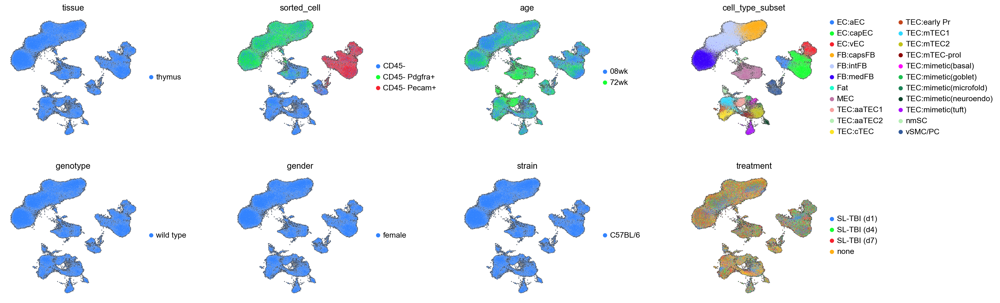

In [20]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    kousajahnzhao_adata, 
    color=['tissue', 'sorted_cell', 'age', 'cell_type_subset', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
kousajahnzhao_adata.obs = kousajahnzhao_adata.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
kousajahnzhao_adata.shape

(81241, 28752)

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/kousa_et_al_2024(TBI).h5ad'

In [ ]:
kousajahnzhao_adata.write(path_to_h5ad)

### Foxn1 tdTomato lineage tracing

In [21]:
path_to_h5ad = '../../[AK002] Thymus aging & regeneration/output/anndata_io/Foxn1tdTom.h5ad'

In [22]:
kousajahnzhao_Foxn1Lin = sc.read_h5ad(path_to_h5ad)
kousajahnzhao_Foxn1Lin.uns['log1p']["base"] = None

In [23]:
kousajahnzhao_Foxn1Lin.obs['tissue']='thymus'
kousajahnzhao_Foxn1Lin.obs['gender']=['female' if '_f' in x else 'male' for x in kousajahnzhao_Foxn1Lin.obs['sample'] ]
kousajahnzhao_Foxn1Lin.obs['strain']='C57BL/6'

In [24]:
kousajahnzhao_Foxn1Lin.obs['sorted_cell']= 'CD45-'
kousajahnzhao_Foxn1Lin.obs['age'] = '80wk'
kousajahnzhao_Foxn1Lin.obs['treatment'] = 'none' 
kousajahnzhao_Foxn1Lin.obs['genotype'] = ['Foxn1-tdTom' if 'Foxn1creTom' in x else 'wild type' for x in kousajahnzhao_Foxn1Lin.obs['sample'] ]

In [25]:
kousajahnzhao_Foxn1Lin.obs['cell_type_subset'] = [ 'TEC:aaTEC1' if 'aaTEC1' in x else 'TEC:aaTEC2' if 'aaTEC2' in x else 'TEC:cTEC' if 'cTEC' in x else
                                                   'TEC:mTEC1' if 'mTEC1' in x else 'TEC:mTEC2' if 'mTEC2' in x else 'TEC:mimetic(basal)' if 'basal' in x else
                                                   'TEC:mTEC-prol' if 'mTEC-prol' in x else 'TEC:mimetic(tuft)' if 'mimetic(tuft)' in x else 'TEC:early Pr' if 'early Pr' in x else
                                                   'TEC:mimetic(neuroendo)' if 'mimetic(neuroendo)' in x else 'TEC:mimetic(goblet)' if 'mimetic(goblet)' in x else 
                                                   'TEC:mimetic(microfold)' if 'mimetic(microfold)' in x else 'EC:aEC' if 'arEC' in x else 
                                                   'EC:capEC' if 'capEC' in x else 'EC:vEC' if 'venEC' in x else 'FB:capsFB' if 'capsFB' in x else 
                                                   'FB:intFB' if 'intFB' in x else 'FB:medFB' if 'medFB' in x else 'MEC' if 'MEC' in x else 
                                                   'vSMC/PC' if 'vSMC/PC' in x else 'nmSC' if 'nmSC' in x else 'Fat' if 'Fat' in x else 
                                                   'error' for x in kousajahnzhao_Foxn1Lin.obs['cell_type_subset'] ]

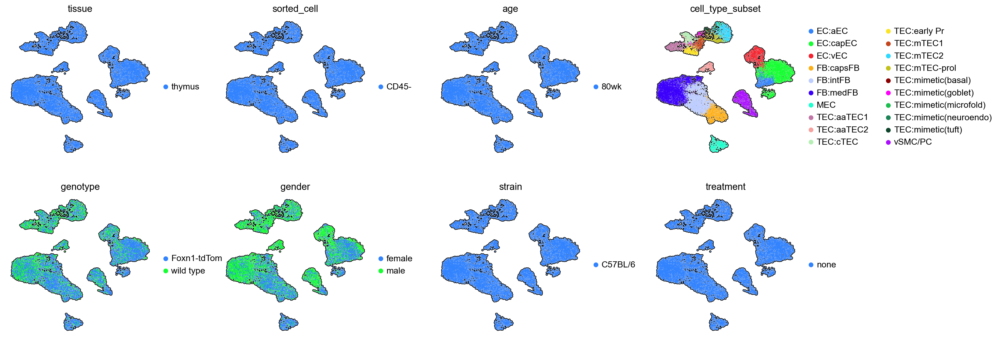

In [28]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    kousajahnzhao_Foxn1Lin, 
    color=['tissue', 'sorted_cell', 'age', 'cell_type_subset', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.3,
    add_outline=True
)

In [ ]:
kousajahnzhao_Foxn1Lin.obs =  kousajahnzhao_Foxn1Lin.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
kousajahnzhao_Foxn1Lin.shape

(13615, 28064)

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/kousa_et_al_2024(Foxn1TdTom).h5ad'

In [ ]:
kousajahnzhao_Foxn1Lin.write(path_to_h5ad)

### Foxn1 LacZ

In [29]:
path_to_h5ad = '../../[AK002] Thymus aging & regeneration/output/anndata_io/Foxn1LacZ.h5ad'

In [30]:
kousajahnzhao_Foxn1LacZ = sc.read_h5ad(path_to_h5ad)
kousajahnzhao_Foxn1LacZ.uns['log1p']["base"] = None

In [31]:
kousajahnzhao_Foxn1LacZ.obs['tissue']='thymus'
kousajahnzhao_Foxn1LacZ.obs['gender']='male'
kousajahnzhao_Foxn1LacZ.obs['strain']='C57BL/6'
kousajahnzhao_Foxn1LacZ.obs['genotype']= ['Foxn1-lacZ' if '_lacZ_' in x else 'Foxn1-wt' for x in kousajahnzhao_Foxn1LacZ.obs['sample'] ]

In [32]:
kousajahnzhao_Foxn1LacZ.obs['sorted_cell']= 'CD45-'
kousajahnzhao_Foxn1LacZ.obs['age'] = '24wk'
kousajahnzhao_Foxn1LacZ.obs['treatment'] = 'none'

In [33]:
kousajahnzhao_Foxn1LacZ.obs['cell_type_subset'] = ['TEC:aaTEC1' if 'aaTEC1' in x else 'TEC:aaTEC2' if 'aaTEC2' in x else 'TEC:cTEC' if 'cTEC' in x else
                                               'TEC:mTEC1' if 'mTEC1' in x else 'TEC:mTEC2' if 'mTEC2' in x else 'TEC:mimetic(basal)' if 'basal' in x else
                                               'TEC:mTEC-prol' if 'mTEC-prol' in x else 'TEC:mimetic(tuft)' if 'mimetic(tuft)' in x else 'TEC:early Pr' if 'early Pr' in x else
                                               'TEC:mimetic(neuroendo)' if 'mimetic(neuroendo)' in x else 'TEC:mimetic(goblet)' if 'mimetic(goblet)' in x else 
                                               'TEC:mimetic(microfold)' if 'mimetic(microfold)' in x else 'EC:aEC' if 'arEC' in x else 'TEC:mimetic(ionocyte)' if 'ionocyte' in x else
                                               'EC:capEC' if 'capEC' in x else 'EC:vEC' if 'venEC' in x else 'FB:capsFB' if 'capsFB' in x else 
                                               'FB:intFB' if 'intFB' in x else 'FB:medFB' if 'medFB' in x else 'MEC' if 'MEC' in x else 
                                               'vSMC/PC' if 'vSMC/PC' in x else 'nmSC' if 'nmSC' in x else 'Fat' if 'Fat' in x else 
                                               'error' for x in kousajahnzhao_Foxn1LacZ.obs['cell_type_subset'] ]

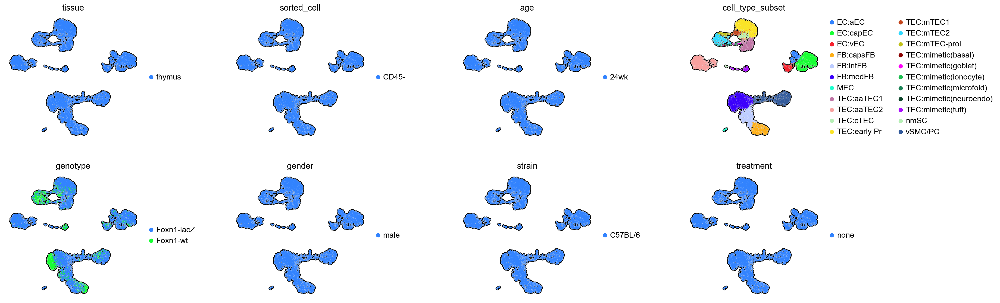

In [36]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    kousajahnzhao_Foxn1LacZ, 
    color=['tissue', 'sorted_cell', 'age', 'cell_type_subset', 'genotype',  'gender',  'strain', 'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
kousajahnzhao_Foxn1LacZ.obs =  kousajahnzhao_Foxn1LacZ.obs.loc[:,['tissue', 'sorted_cell', 'cell_type_subset', 'age', 'gender', 'genotype', 'strain', 'treatment']]

In [ ]:
kousajahnzhao_Foxn1LacZ.shape

(8387, 28320)

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/kousa_et_al_2024(Foxn1LacZ).h5ad'

In [ ]:
kousajahnzhao_Foxn1LacZ.write(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='integration'></a>

## Concat public data and ours

In [37]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/kernfeld_et_al_2018.h5ad'

In [38]:
kernfeld_adata = sc.read_h5ad(path_to_h5ad)

In [39]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/bornstein_et_al_2018.h5ad'

In [40]:
bornstein_adata = sc.read_h5ad(path_to_h5ad)

In [41]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/dhalla_et_al_2019.h5ad'

In [42]:
dhalla_adata = sc.read_h5ad(path_to_h5ad)

In [43]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/baranGale_et_al_2020.h5ad'

In [44]:
baranGale_adata = sc.read_h5ad(path_to_h5ad)

In [45]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/wells_et_al_2020.h5ad'

In [46]:
wells_adata = sc.read_h5ad(path_to_h5ad)

In [47]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/rota_et_al_2021.h5ad'

In [48]:
rota_adata = sc.read_h5ad(path_to_h5ad)

In [49]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/nusser_et_al_2022.h5ad'

In [50]:
nusser_adata = sc.read_h5ad(path_to_h5ad)

In [51]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/michelson_et_al_2022.h5ad'

In [52]:
michelson_adata_2022 = sc.read_h5ad(path_to_h5ad)

In [53]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/klein_et_al_2023.h5ad'

In [54]:
klein_adata = sc.read_h5ad(path_to_h5ad)

In [55]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/farley_et_al_2023.h5ad'

In [56]:
farley_adata = sc.read_h5ad(path_to_h5ad)

In [57]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/givony_et_al_2023.h5ad'

In [58]:
givony_adata = sc.read_h5ad(path_to_h5ad)

In [59]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/michelson_et_al_2023.h5ad'

In [60]:
michelson_adata_2023 = sc.read_h5ad(path_to_h5ad)

In [61]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/horie_et_al_2023.h5ad'

In [62]:
horie_adata = sc.read_h5ad(path_to_h5ad)

In [63]:
# add tissue
adata_TOTAL = sc.concat(
    [kousajahnzhao_adata, kousajahnzhao_Foxn1Lin, kousajahnzhao_Foxn1LacZ, kernfeld_adata, bornstein_adata, dhalla_adata, baranGale_adata, wells_adata,
     rota_adata, nusser_adata, michelson_adata_2022, klein_adata, farley_adata, givony_adata, michelson_adata_2023, horie_adata], # add more annadata objects here separated by commas
    join='outer', 
    label = 'entry',
    keys = ['kousa-jahn-zhao', 'Foxn1Lin', 'Foxn1LacZ', 'kernfeld', 'bornstein',  'dhalla', 'baran-gale',  'wells', 
            'rota', 'nusser', 'michelson-2022', 'klein', 'farley', 'givony', 'michelson-2023', 'horie'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

In [64]:
np.random.seed(42)
index_list = np.arange(adata_TOTAL.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
adata_TOTAL = adata_TOTAL[index_list]

In [65]:
adata_TOTAL.shape

(297988, 62685)

In [66]:
sc.pp.filter_genes(adata_TOTAL, min_cells=100) # remove columns with all 0s

In [67]:
adata_TOTAL.obs['dataset'] = ['Kousa et al.' if (x=='kousa-jahn-zhao' or x=='Foxn1Lin' or x=='Foxn1LacZ') else
                              'Kernfeld et al. (2018)' if x=='kernfeld' else 'Bornstein et al. (2018)' if x=='bornstein' else 'Dhalla et al. (2019)' if x=='dhalla' else 
                              'Baran-Gale et al. (2020)' if x=='baran-gale' else 'Wells et al. (2020)' if x=='wells' else 'Rota et al. (2021)' if x=='rota' else
                              'Nusser et al. (2022)' if x=='nusser' else 'Michelson et al. (2022)' if x=='michelson-2022' else 'Klein et al. (2022)' if x=='klein' else
                              'Farley et al. (2023)' if x=='farley' else 'Givony et al. (2023)' if x=='givony' else 'Michelson et al. (2023)' if x=='michelson-2023' else
                              'Horie et al. (2023)' if x=='horie' else 'ERROR' for x in adata_TOTAL.obs['entry']]

In [68]:
adata_TOTAL.obs['age_range'] = ['P0-7' if (x=='01wk' or x=='P0' or x=='P6') else 'culture' if x=='culture' else
                                '2-14wk' if (x=='04-06wk' or x=='04-08wk' or x=='04-14wk' or x=='04wk' or x=='05wk' or x=='08wk' or x=='09wk') else 
                                '16-24wk' if (x=='16wk' or x=='24wk') else '72-80wk' if (x=='72wk' or x=='80wk') else 'E' for x in adata_TOTAL.obs['age']]

In [69]:
sc.pp.highly_variable_genes(adata_TOTAL, n_top_genes=4000, n_bins=20, flavor='seurat',  inplace=True)

In [70]:
adata_TOTAL.uns['tissue_colors'] = user_defined_palette
adata_TOTAL.uns['age_range_colors'] = user_defined_palette
adata_TOTAL.uns['age_colors'] = user_defined_palette
adata_TOTAL.uns['gender_colors'] = user_defined_palette
adata_TOTAL.uns['sorted_cell_colors'] = ['#16FF32', '#3283FE',  '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
adata_TOTAL.uns['genotype_colors'] = user_defined_palette
adata_TOTAL.uns['strain_colors'] = user_defined_palette
adata_TOTAL.uns['treatment_colors'] = user_defined_palette
adata_TOTAL.uns['dataset_colors'] = user_defined_palette
adata_TOTAL.uns['cell_type_subset_colors'] = ['#f6222e', '#3283fe', 'beige', '#16ff32',  '#bdcdff', 'beige', '#aa0dfe', '#1cffce', 'grey', '#d62728',
                                              '#2ED9FF', '#c1c119', '#8b0000', '#3B00FC', '#FE00FA',  '#1CBE4F', '#F8A19F', '#B5EFB5','#9195F6',   '#325A9B', '#F9F07A', '#C075A6', '#7F27FF', '#FEAF16', 'black', '#BEFFF7', 'beige',
                                              '#FFA5D2', '#19c9b3', 'beige']

In [71]:
for n_comps in [70]:
    rng = np.random.RandomState(42)
    sc.tl.pca(adata_TOTAL, n_comps=n_comps, svd_solver='arpack', random_state=rng, use_highly_variable=True)
    sce.pp.harmony_integrate(adata_TOTAL, 'entry')
    sc.pp.neighbors(adata_TOTAL, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
    for min_dist in [0.45]:
        sc.tl.umap(adata_TOTAL, min_dist=min_dist)

2024-04-22 14:56:17,930 - harmonypy - INFO - Iteration 1 of 10
2024-04-22 14:57:27,613 - harmonypy - INFO - Iteration 2 of 10
2024-04-22 14:58:36,274 - harmonypy - INFO - Iteration 3 of 10
2024-04-22 14:59:46,022 - harmonypy - INFO - Iteration 4 of 10
2024-04-22 15:00:56,246 - harmonypy - INFO - Converged after 4 iterations


In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_TOTAL, 
    color=['tissue', 'age_range', 'age', 'gender','sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset'], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.75,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

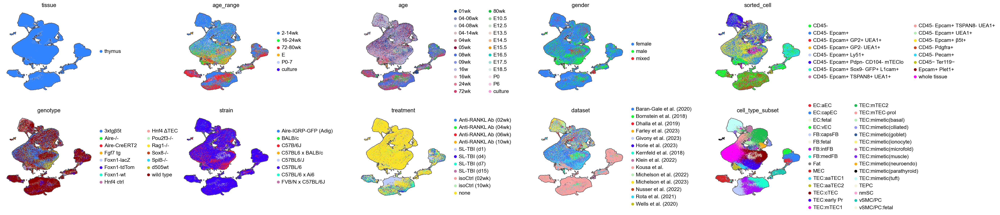

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_TOTAL, 
    color=['tissue', 'age_range', 'age', 'gender','sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset'], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.75,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
adata_TOTAL.obs = adata_TOTAL.obs.loc[:,['tissue', 'age_range', 'age', 'gender', 'sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset', 'entry']]

In [ ]:
adata_TOTAL.obs = adata_TOTAL.obs.loc[:,['tissue', 'age_range', 'age', 'gender', 'sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset']]

In [ ]:
adata_TOTAL.uns['neighbors']['params']['random_state'] = 'RandomState(MT19937) at 0x10A66C240'

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/thymosight_cd45neg_TOTAL_mouse.h5ad'

In [ ]:
adata_TOTAL.write(path_to_h5ad)

In [ ]:
adata_TOTAL = sc.read_h5ad(path_to_h5ad)

### Isolate only TEC

In [74]:
adata_TOTAL_TEC = adata_TOTAL[(adata_TOTAL.obs['cell_type_subset']=='TEPC') | (adata_TOTAL.obs['cell_type_subset']=='TEC:aaTEC1') | (adata_TOTAL.obs['cell_type_subset']=='TEC:aaTEC2') | 
                              (adata_TOTAL.obs['cell_type_subset']=='TEC:cTEC') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mTEC1') | (adata_TOTAL.obs['cell_type_subset']=='TEC:early Pr') | 
                              (adata_TOTAL.obs['cell_type_subset']=='TEC:mTEC-prol') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mTEC2') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(basal)') | 
                              (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(ciliated)') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(goblet)') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(ionocyte)') | 
                              (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(microfold)') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(muscle)') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(neuroendo)') |
                              (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(parathyroid)') | (adata_TOTAL.obs['cell_type_subset']=='TEC:mimetic(tuft)') | (adata_TOTAL.obs['cell_type_subset']=='TEPC')] 

In [75]:
sc.pp.filter_genes(adata_TOTAL_TEC, min_cells=1) # remove columns with all 0s

In [76]:
sc.pp.highly_variable_genes(adata_TOTAL_TEC, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [77]:
rng = np.random.RandomState(42)
sc.tl.pca(adata_TOTAL_TEC, n_comps=55, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [78]:
sce.pp.harmony_integrate(adata_TOTAL_TEC, 'entry')

2024-04-22 15:05:53,594 - harmonypy - INFO - Iteration 1 of 10
2024-04-22 15:06:38,596 - harmonypy - INFO - Iteration 2 of 10
2024-04-22 15:07:23,111 - harmonypy - INFO - Iteration 3 of 10
2024-04-22 15:08:08,341 - harmonypy - INFO - Iteration 4 of 10
2024-04-22 15:08:53,075 - harmonypy - INFO - Iteration 5 of 10
2024-04-22 15:09:38,289 - harmonypy - INFO - Iteration 6 of 10
2024-04-22 15:10:15,428 - harmonypy - INFO - Converged after 6 iterations


In [79]:
sc.pp.neighbors(adata_TOTAL_TEC, n_neighbors=15, use_rep='X_pca_harmony',  random_state=rng)

In [80]:
sc.tl.umap(adata_TOTAL_TEC, min_dist=0.35)

In [81]:
adata_TOTAL_TEC.uns['tissue_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['stage_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['age_range_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['age_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['gender_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['sorted_cell_colors'] = ['#16FF32', '#3283FE',  '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
adata_TOTAL_TEC.uns['genotype_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['strain_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['treatment_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['dataset_colors'] = user_defined_palette
adata_TOTAL_TEC.uns['cell_type_subset_colors'] = ['#2ED9FF', '#c1c119', '#8b0000', '#3B00FC', '#FE00FA',  '#1CBE4F', '#F8A19F', '#B5EFB5','#9195F6',   '#325A9B', '#F9F07A', '#C075A6', '#7F27FF', '#FEAF16', 'black', '#BEFFF7', 'beige', '#FFA5D2', '#19c9b3', 'beige']

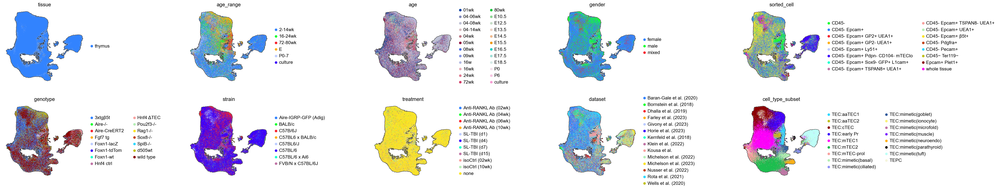

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata_TOTAL_TEC, 
    color=['tissue', 'age_range', 'age', 'gender','sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset'], 
    ncols=5,
    size=5,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 1,
    add_outline=True
)

In [83]:
x=19
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(adata_TOTAL_TEC, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

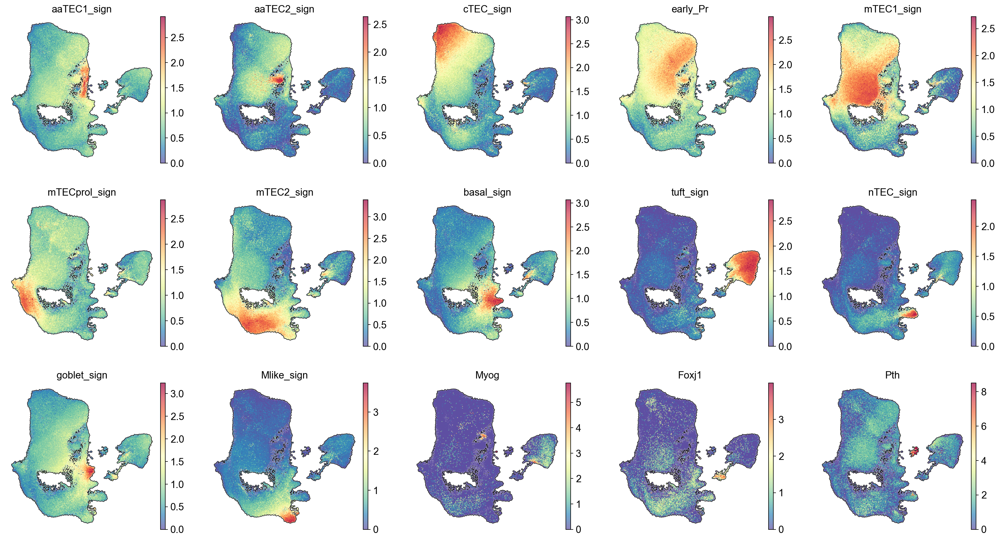

In [84]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_TOTAL_TEC,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign', 'Myog', 'Foxj1', 'Pth'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [ ]:
adata_TOTAL_TEC.obs = adata_TOTAL_TEC.obs.loc[:,['tissue', 'age_range', 'age', 'gender','sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset']]

In [ ]:
adata_TOTAL_TEC.shape

(205625, 31231)

In [ ]:
adata_TOTAL_TEC.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x94E6F1540')

In [85]:
adata_TOTAL_TEC.obs = adata_TOTAL_TEC.obs.loc[:,['tissue', 'age_range', 'age', 'gender','sorted_cell',  'genotype', 'strain', 'treatment', 'dataset', 'cell_type_subset']]
del adata_TOTAL_TEC.uns
del adata_TOTAL_TEC.var
del adata_TOTAL_TEC.varm
del adata_TOTAL_TEC.obsp
del adata_TOTAL_TEC.obsm['X_pca']
del adata_TOTAL_TEC.obsm['X_pca_harmony']

In [ ]:
adata_TOTAL_TEC.shape

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/mouse/thymosight_cd45neg_TEC_TOTAL_mouse.h5ad'

In [ ]:
adata_TOTAL_TEC.write(path_to_h5ad)